In [2]:
from Model import Model
import pandas as pd
import numpy as np
import itertools
import shap
from sklearn.model_selection import train_test_split
# from Parameters import Parameters

# t = Parameters('ranf').training_reg_params

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
model = Model('ranf')

In [4]:
X,Y = model.preprocessing.load_data('./Agg_data_from_frame_251.xlsx',labels=False,sheet_name="Sheet1")
Y_most_likely = model.preprocessing.load_Y('./Agg_most_likely.xlsx',video_name=False,column_name="same")
Y_old = model.preprocessing.load_Y('../Updated_targets_300519.xlsx',video_name=False,column_name="diff")
Y_new = model.preprocessing.load_Y('../../Frame_Analysis/new_targets_21062019.xlsx',video_name=False,column_name="diff")
Y_unaided = model.preprocessing.load_Y('./Agg_Unaided.xlsx',video_name=False,column_name="same")

In [5]:
X = X.set_index(X['Video Name'])
# X = X.drop('Unnamed: 0',1)
Y_old['Video Name'] = Y_old.index.values
Y_new['Video Name'] = Y_new.index.values

Y_new = Y_new[Y_new['Video Name']!= 'Surface Laptop_UK_30_Courtney v2 US VO_TV']
Y_new = Y_new[Y_new['Video Name']!='284 Surface Laptop_UK_30_Courtney v2 US VO_TV' ]
Y_new = Y_new.drop('Video Name',1)
Y = pd.concat((Y_old,Y_new),axis=1)
Y = pd.concat((Y,Y_most_likely),axis=1)
X = X.loc[X['Campaign']=='Surface']
Y = Y.loc[X.index.values,:]
Y['Unaided_Branding'] = Y_unaided.loc[Y.index,['Unaided Branding']]

In [6]:
Y.dropna(how='all')
X,Y= model.preprocessing.clean_data(X,Y)

In [7]:
# surface_pro_frames = [col for col in X.columns if "Surface Pro".lower() in col.lower()]
# for suf in ['_dur','_first_ocr','_last_ocr','_total_ocr']:
#     cols = [col+suf for col in surface_pro_frames[:10]]
#     X = model.preprocessing.addNewFeature(X,cols,_type="sum",new_column_name="Surface"+suf)
# X = X.drop(surface_pro_frames,axis=1)

In [8]:
frame_count_columns = [col for col in X.columns.values if '_dur' in col]
columns_removed =[]
for x in X.columns.values:
    if '_frame_count' in x:
        columns_removed.append(x)
cols = [col[:-12] for col in columns_removed]
for x in frame_count_columns:
#     if x+'_dur' in X.columns.values or '_frame_count' in x:
    if x[:-4] not in cols:
        columns_removed.append(x[:-4])
columns_removed.remove('Intel')
# columns_removed.remove('Surface')

In [9]:
X = X.drop(columns=columns_removed,axis=1)
columns_removed

['African_frame_count',
 'Caucasian_frame_count',
 'Eastasian_frame_count',
 'Latino_frame_count',
 'Angry_frame_count',
 'Disgust_frame_count',
 'Fear_frame_count',
 'Happiness_frame_count',
 'Neutral_frame_count',
 'Sadness_frame_count',
 'Surprise_frame_count',
 'Age: 0-15_frame_count',
 'Age: 15-24_frame_count',
 'Age: 25-34_frame_count',
 'Age: 35-44_frame_count',
 'Age: 45-60_frame_count',
 'Female_frame_count',
 'Male_frame_count',
 'microsoft',
 'ASUS T102',
 'Dell_sub_brand_group',
 'HP_group',
 'Lenovo_group',
 'Macbook_group',
 'Surface_group',
 'Windows',
 'Yoga',
 'Asus_text',
 'Currys PCs world_text',
 'Dell_text',
 'Hp_text',
 'Lenovo_text',
 'Apple',
 'Asus',
 'Dell',
 'Hp',
 'Microsoft_text',
 'Laptop',
 'Tablet',
 'Mobile',
 'PC']

In [10]:
# new_features =[["Happiness_dur",'Female_dur'],["Surprise_dur","Male_dur"],["Neutral_dur","Male_dur"],["Happiness_dur","Age: 0-15_dur"],["Disgust_dur","Age: 45-60_dur"],["Surprise_dur","Age: 0-15_dur"],["Neutral_dur","Age: 25-34_dur"],["Happiness_dur","Eastasian_dur"],["Surprise_dur","Eastasian_dur"]]
# age_cols = ['Age: 0-15_dur', 'Age: 15-24_dur','Age: 25-34_dur', 'Age: 35-44_dur', 'Age: 45-60_dur']
# ethinicity_cols = ['African_dur', 'Caucasian_dur', 'Eastasian_dur','Latino_dur']
# gender_cols = ["Female_dur","Male_dur"]
emotion_cols = ["Happiness_dur","Surprise_dur","Neutral_dur","Sadness_dur"]
# age_ethinicity_col = list(itertools.product(age_cols,ethinicity_cols))
# new_features.extend(age_ethinicity_col)
# X = model.preprocessing.addNewFeature(X,new_features,_type='per')
# X['Happiness_length_of_ad_impact'] = X['Happiness_dur'] * (1-X['length_of_ad_15'])

In [11]:
# X = X.drop(age_cols,1)
# X = X.drop(ethinicity_cols,1)
# X = X.drop(gender_cols,1)
# X = X.drop(emotion_cols,1)

In [12]:
model.preprocessing.checkNull(X).head()
X= model.preprocessing.removeNULLColumns(X,percentage=0.8)
model.preprocessing.checkNull(X).head()

African_dur         78.1250
Age: 35-44_dur      75.0000
Sadness_dur         62.5000
Tablet_total_ocr    45.3125
Tablet_last_ocr     45.3125
dtype: float64

In [13]:
ocr_columns = [col for col in X.columns if "ocr" in col]

X[ocr_columns] = model.preprocessing.imputeConstant(X,columns=ocr_columns,constant=-1)
X = model.preprocessing.replace(X,np.inf,np.nan)

In [14]:
X = model.preprocessing.imputeConstant(X,constant=0)
X = X.fillna(0)

In [15]:
Y = model.preprocessing.imputeMedian(Y,model.preprocessing.targets)
Y.isna().sum()

Unaided_Branding                          0
Brand_Cues__Mean                          0
Aided_Branding__Mean                      0
Active_Involvement__Mean                  0
New_Information__Mean                     0
Enjoyment__Mean                           0
Brand_Appeal__Mean                        0
Understanding__Mean                       0
Relevance_of_Information__Mean            0
Credibility_of_Information__Mean          0
Brand_Difference__Mean                    0
Video Name                                0
Interest_peak                             0
Interest_mean_score                       0
Purchase_intent                           0
Persuasion_mean                           0
Persuasion_very_likely                    0
Interest_peak_frames                      0
Enjoyment_vey_much                        0
Aided_Branding_almost_anything            0
Brand_Cues_very_easily                    0
Brand_Appeal_more_appealing               0
Understanding_very_easily       

In [16]:
X.shape

(64, 123)

In [17]:
(X.columns.values,len(Y.columns))

(array(['Video Name', 'African_dur', 'Caucasian_dur', 'Eastasian_dur',
        'Happiness_dur', 'Neutral_dur', 'Sadness_dur', 'length_of_ad_15',
        'Female_dur', 'Male_dur', 'Age: 25-34_dur', 'Age: 35-44_dur',
        'microsoft_dur', 'microsoft_first_ocr', 'microsoft_last_ocr',
        'microsoft_total_ocr', 'ASUS T102_dur', 'Dell_sub_brand_group_dur',
        'HP_group_dur', 'Lenovo_group_dur', 'Macbook_group_dur',
        'Surface_group_dur', 'Windows_dur', 'Yoga_dur',
        'Surface_group_first_ocr', 'Surface_group_last_ocr',
        'Surface_group_total_ocr', 'Laptop_dur', 'Laptop_first_ocr',
        'Laptop_last_ocr', 'Laptop_total_ocr', 'Tablet_dur',
        'Tablet_first_ocr', 'Tablet_last_ocr', 'Tablet_total_ocr',
        'railing', 'biking', 'brick', 'research', 'far-away horizon',
        'cloth', 'cold', 'playing', 'semi-enclosed area', 'dirty', 'aged',
        'reading', 'man-made', 'natural light', 'dry', 'medical activity',
        'moist', 'transporting', 'steril

In [18]:
# Y_14 = Y.loc[:,Y.isna().sum()==0]
# Y_4 = Y.loc[:,Y.isna().sum()!=0]
# X_4 = X[Y_4['Unaided_Branding'].isna()==False]
# Y_4 = Y_4[Y_4['Unaided_Branding'].isna()==False]

In [19]:
(X.dtypes[30:40] == object)

Laptop_total_ocr    False
Tablet_dur          False
Tablet_first_ocr    False
Tablet_last_ocr     False
Tablet_total_ocr    False
railing             False
biking              False
brick               False
research            False
far-away horizon    False
dtype: bool

In [20]:
X_res_27,Y_res_27 = model.preprocessing.overSampling(X,Y.drop('Video Name',1),each_Col=False,size=800,random_state=12)
X_train_27,X_test_27,y_train_27,y_test_27 = train_test_split(X_res_27,Y_res_27,random_state = 123,test_size=0.3)

# X_res_4,Y_res_4 = model.preprocessing.overSampling(X_4,Y_4,each_Col=False,size=1000,random_state=12)
# X_train_4,X_test_4,y_train_4,y_test_4 = train_test_split(X_res_4,Y_res_4,random_state = 123,test_size=0.3)

In [21]:
# print("------------------------ 14 Models Training ----------------------------\n")
# models_14 = model.train(X_train_14,y_train_14,X_test_14,y_test_14,metrics='r2',plot_error=False,set_params=True,params=t)
print("------------------------ 17 Models Training ----------------------------\n")
models_27,acc_df = model.train(X_train_27,y_train_27,X_test_27,y_test_27,metrics='r2',plot_error=False)

------------------------ 17 Models Training ----------------------------

Unaided_Branding


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    1.4s remaining:    2.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.934125
For test set
r2_score: 0.892793


Brand_Cues__Mean


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.9s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.790721
For test set
r2_score: 0.909660


Aided_Branding__Mean


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.4s remaining:    0.6s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.860429
For test set
r2_score: 0.917252


Active_Involvement__Mean


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.6s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.936765
For test set
r2_score: 0.906469


New_Information__Mean


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.6s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.935811
For test set
r2_score: 0.953990


Enjoyment__Mean


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    1.3s remaining:    1.9s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.915967
For test set
r2_score: 0.927243


Brand_Appeal__Mean


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.7s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.940564
For test set
r2_score: 0.953585


Understanding__Mean


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.7s remaining:    1.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.901938
For test set
r2_score: 0.943686


Relevance_of_Information__Mean


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.6s remaining:    0.8s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.946640
For test set
r2_score: 0.963452


Credibility_of_Information__Mean


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.4s remaining:    0.5s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.924154
For test set
r2_score: 0.927166


Brand_Difference__Mean


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    1.4s remaining:    2.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.946485
For test set
r2_score: 0.945591


Interest_peak


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.8s remaining:    1.3s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.861538
For test set
r2_score: 0.841633


Interest_mean_score


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.3s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.905717
For test set
r2_score: 0.896261


Purchase_intent


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.1s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.958083
For test set
r2_score: 0.966266


Persuasion_mean


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.6s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.925026
For test set
r2_score: 0.894076


Persuasion_very_likely


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.5s remaining:    3.7s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.935606
For test set
r2_score: 0.907551


Interest_peak_frames


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.3s remaining:    3.5s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.860539
For test set
r2_score: 0.844484


Enjoyment_vey_much


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.2s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.931129
For test set
r2_score: 0.929028


Aided_Branding_almost_anything


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.1s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.896429
For test set
r2_score: 0.889532


Brand_Cues_very_easily


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.0s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.878466
For test set
r2_score: 0.941124


Brand_Appeal_more_appealing


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.1s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.932198
For test set
r2_score: 0.946912


Understanding_very_easily


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.0s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.916344
For test set
r2_score: 0.958750


Relevance_Information_very_relevant


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.1s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.943669
For test set
r2_score: 0.970819


Credibility_Information_agree_strongly


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.0s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.937384
For test set
r2_score: 0.939695


New_Information_alot


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.0s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


For training set
r2_score: 0.947063
For test set
r2_score: 0.975036


Brand_Difference_strongly


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.2s remaining:    3.4s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


For training set
r2_score: 0.939076
For test set
r2_score: 0.942927




[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


In [22]:
acc_df

,Unaided_Branding,Brand_Cues__Mean,Aided_Branding__Mean,Active_Involvement__Mean,New_Information__Mean,Enjoyment__Mean,Brand_Appeal__Mean,Understanding__Mean,Relevance_of_Information__Mean,Credibility_of_Information__Mean,...,Interest_peak_frames,Enjoyment_vey_much,Aided_Branding_almost_anything,Brand_Cues_very_easily,Brand_Appeal_more_appealing,Understanding_very_easily,Relevance_Information_very_relevant,Credibility_Information_agree_strongly,New_Information_alot,Brand_Difference_strongly
0,0.934125,0.790721,0.860429,0.936765,0.935811,0.915967,0.940564,0.901938,0.94664,0.924154,...,0.860539,0.931129,0.896429,0.878466,0.932198,0.916344,0.943669,0.937384,0.947063,0.939076
1,0.892793,0.90966,0.917252,0.906469,0.95399,0.927243,0.953585,0.943686,0.963452,0.927166,...,0.844484,0.929028,0.889532,0.941124,0.946912,0.95875,0.970819,0.939695,0.975036,0.942927
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
model_dt = Model('DT')
models_27_dt = model_dt.train(X_train_27,y_train_27,X_test_27,y_test_27,metrics='r2',plot_error=False)

Unaided_Branding
For training set
r2_score: 0.685101
For test set
r2_score: 0.588970


Brand_Cues__Mean
For training set
r2_score: 0.329377
For test set
r2_score: 0.482467


Aided_Branding__Mean
For training set
r2_score: 0.435561
For test set
r2_score: 0.542694


Active_Involvement__Mean
For training set
r2_score: 0.658795
For test set
r2_score: 0.707069


New_Information__Mean
For training set
r2_score: 0.594984
For test set
r2_score: 0.714858


Enjoyment__Mean


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_

For training set
r2_score: 0.517245
For test set
r2_score: 0.599343


Brand_Appeal__Mean
For training set
r2_score: 0.613915
For test set
r2_score: 0.623840


Understanding__Mean
For training set
r2_score: 0.556245
For test set
r2_score: 0.624459


Relevance_of_Information__Mean
For training set
r2_score: 0.636530
For test set
r2_score: 0.799541


Credibility_of_Information__Mean
For training set
r2_score: 0.607054
For test set
r2_score: 0.632783


Brand_Difference__Mean
For training set
r2_score: 0.630985
For test set
r2_score: 0.691557


Interest_peak


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parall

For training set
r2_score: 0.418610
For test set
r2_score: 0.357529


Interest_mean_score
For training set
r2_score: 0.498940
For test set
r2_score: 0.635576


Purchase_intent
For training set
r2_score: 0.666730
For test set
r2_score: 0.590643


Persuasion_mean
For training set
r2_score: 0.789829
For test set
r2_score: 0.555745


Persuasion_very_likely
For training set
r2_score: 0.717647
For test set
r2_score: 0.511512


Interest_peak_frames
For training set
r2_score: 0.418610
For test set
r2_score: 0.357529


Enjoyment_vey_much


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parall

For training set
r2_score: 0.681861
For test set
r2_score: 0.649613


Aided_Branding_almost_anything
For training set
r2_score: 0.535681
For test set
r2_score: 0.481700


Brand_Cues_very_easily
For training set
r2_score: 0.523141
For test set
r2_score: 0.653875


Brand_Appeal_more_appealing
For training set
r2_score: 0.571899
For test set
r2_score: 0.648247


Understanding_very_easily
For training set
r2_score: 0.567015
For test set
r2_score: 0.593057


Relevance_Information_very_relevant
For training set
r2_score: 0.610122
For test set
r2_score: 0.688928


Credibility_Information_agree_strongly
For training set
r2_score: 0.598910
For test set
r2_score: 0.590271


New_Information_alot
For training set
r2_score: 0.605166
For test set
r2_score: 0.731289


Brand_Difference_strongly
For training set
r2_score: 0.667360
For test set
r2_score: 0.658479




[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished


### Change folder path

In [27]:
model_dt.plot_tree(savefig=True,folder="./Version_6/Surface/Plots_dt/")

Unaided_Branding
Feature ranking:
dirt
Laptop_first_ocr
microsoft_first_ocr
Surface_group_dur
hiking
Surface_group_first_ocr
ice
Surface_group_last_ocr
Happiness_dur
spectating
Caucasian_dur
Female_dur
Surface_group_total_ocr
training
symmetrical
still water
moist
Eastasian_dur
microsoft_last_ocr
microsoft_total_ocr
Laptop_dur
Laptop_last_ocr
microsoft_dur
shopping
African_dur
warm
touring
cluttered space
pavement
Laptop_total_ocr
Age: 25-34_dur
snow
Sadness_dur
socializing
clouds
leaves
Male_dur
boating
Macbook_group_dur
stressful
diving
brick
asphalt
Age: 35-44_dur
bathing
dirty
exercise
Tablet_total_ocr
gaming
rugged scene
Neutral_dur
flowers
plastic
ocean
trees
congregating
research
Tablet_dur
sunny
using tools
horizontal components
sand
length_of_ad_15
sterile
glass
cold
Tablet_last_ocr
studying
Tablet_first_ocr
transporting
driving
competing
running water
sports
aged
carpet
soothing
smoke
medical activity
reading
scary
metal
semi-enclosed area
paper
grass
vegetation
playing
raili

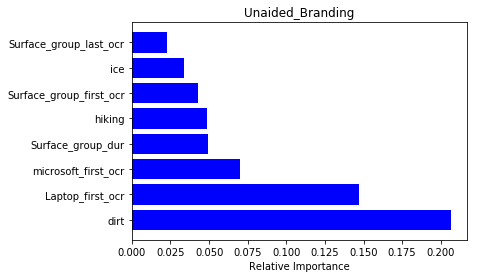

Brand_Cues__Mean
Feature ranking:
spectating
microsoft_first_ocr
African_dur
Neutral_dur
Surface_group_dur
Surface_group_last_ocr
microsoft_total_ocr
Tablet_first_ocr
sand
Tablet_total_ocr
Eastasian_dur
Male_dur
Caucasian_dur
Laptop_dur
Macbook_group_dur
warm
Tablet_last_ocr
socializing
plastic
Age: 25-34_dur
Tablet_dur
still water
Laptop_total_ocr
playing
Surface_group_first_ocr
Laptop_last_ocr
Laptop_first_ocr
Sadness_dur
snow
microsoft_last_ocr
Surface_group_total_ocr
Happiness_dur
driving
conducting business
ice
congregating
cold
soothing
carpet
training
microsoft_dur
ocean
boating
sports
glass
Female_dur
Age: 35-44_dur
tiles
brick
leaves
exercise
grass
swimming
moist
shopping
metal
horizontal components
vinyl
fire
vegetation
dirty
railing
studying
cluttered space
reading
research
transporting
rugged scene
shrubbery
clouds
touring
foliage
medical activity
dry
diving
wood
sunny
scary
asphalt
matte
flowers
trees
using tools
paper
stressful
vertical components
dirt
gaming
climbing
sem

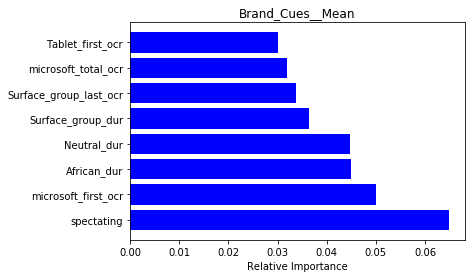

Aided_Branding__Mean
Feature ranking:
moist
microsoft_total_ocr
still water
Surface_group_last_ocr
spectating
Surface_group_dur
Laptop_total_ocr
Surface_group_first_ocr
glass
plastic
Happiness_dur
Tablet_last_ocr
microsoft_first_ocr
Tablet_total_ocr
Tablet_dur
Sadness_dur
African_dur
Age: 25-34_dur
Neutral_dur
Laptop_dur
Tablet_first_ocr
congregating
Female_dur
Laptop_last_ocr
socializing
microsoft_last_ocr
microsoft_dur
Surface_group_total_ocr
Eastasian_dur
Male_dur
snow
shopping
swimming
ice
sports
carpet
grass
sand
leaves
Laptop_first_ocr
exercise
training
dry
boating
smoke
railing
warm
Age: 35-44_dur
Caucasian_dur
brick
stressful
ocean
sunny
scary
transporting
man-made
medical activity
diving
reading
soothing
metal
eating
touring
clouds
foliage
shrubbery
asphalt
horizontal components
research
length_of_ad_15
using tools
no horizon
vegetation
trees
studying
cold
cluttered space
running water
flowers
gaming
sterile
far-away horizon
vertical components
driving
climbing
symmetrical
pap

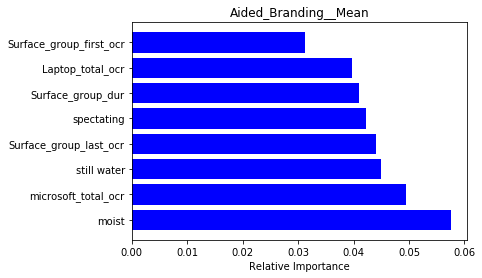

Active_Involvement__Mean
Feature ranking:
brick
Surface_group_last_ocr
microsoft_first_ocr
cold
Laptop_dur
clouds
still water
microsoft_total_ocr
Surface_group_first_ocr
warm
Laptop_last_ocr
stressful
Tablet_total_ocr
length_of_ad_15
microsoft_last_ocr
boating
Tablet_last_ocr
Caucasian_dur
congregating
Tablet_dur
Surface_group_dur
metal
Female_dur
Laptop_total_ocr
Tablet_first_ocr
gaming
Surface_group_total_ocr
microsoft_dur
shrubbery
Neutral_dur
Eastasian_dur
trees
Age: 25-34_dur
grass
biking
foliage
Laptop_first_ocr
sunny
Male_dur
leaves
studying
ocean
paper
tiles
Happiness_dur
Sadness_dur
running water
socializing
plastic
sports
moist
training
research
soothing
Age: 35-44_dur
medical activity
competing
asphalt
symmetrical
African_dur
spectating
rugged scene
driving
far-away horizon
using tools
cluttered space
reading
vegetation
diving
touring
smoke
snow
shopping
flowers
sterile
dry
scary
exercise
natural
semi-enclosed area
horizontal components
aged
transporting
glass
camping
vertic

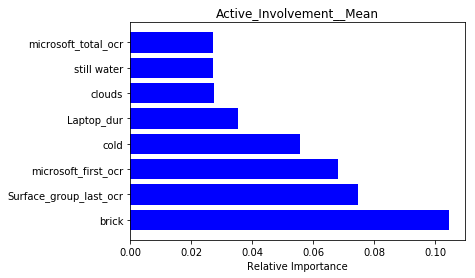

New_Information__Mean
Feature ranking:
Surface_group_first_ocr
Surface_group_total_ocr
scary
Tablet_first_ocr
Tablet_total_ocr
brick
Tablet_last_ocr
African_dur
Tablet_dur
tiles
Neutral_dur
sports
Surface_group_dur
transporting
Surface_group_last_ocr
warm
Laptop_total_ocr
Caucasian_dur
microsoft_last_ocr
dirty
Laptop_last_ocr
cluttered space
rugged scene
studying
microsoft_total_ocr
Age: 25-34_dur
Happiness_dur
Macbook_group_dur
boating
touring
railing
microsoft_first_ocr
competing
microsoft_dur
Laptop_first_ocr
Age: 35-44_dur
research
grass
ocean
Laptop_dur
Eastasian_dur
Male_dur
carpet
Female_dur
Sadness_dur
dry
exercise
reading
cold
socializing
plastic
soothing
climbing
driving
trees
pavement
conducting business
enclosed area
playing
clouds
length_of_ad_15
asphalt
still water
flowers
semi-enclosed area
metal
spectating
medical activity
sunny
indoor lighting
congregating
leaves
shopping
vertical components
training
stressful
cloth
open area
vegetation
working
diving
matte
vinyl
swimm

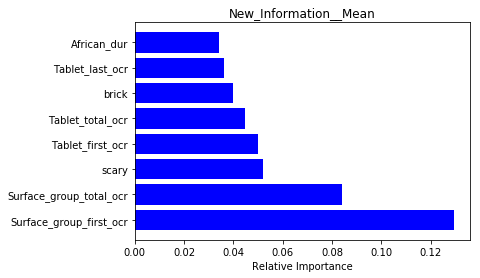

Enjoyment__Mean
Feature ranking:
microsoft_total_ocr
Macbook_group_dur
Neutral_dur
microsoft_first_ocr
African_dur
microsoft_last_ocr
trees
Caucasian_dur
Surface_group_dur
gaming
playing
Surface_group_last_ocr
Surface_group_first_ocr
paper
clouds
Happiness_dur
camping
plastic
Surface_group_total_ocr
Age: 25-34_dur
length_of_ad_15
Laptop_total_ocr
reading
Tablet_first_ocr
training
aged
Laptop_dur
microsoft_dur
far-away horizon
Sadness_dur
Female_dur
Laptop_last_ocr
using tools
Tablet_last_ocr
Male_dur
studying
research
soothing
sunny
biking
Laptop_first_ocr
Tablet_dur
metal
Eastasian_dur
dry
rugged scene
stressful
socializing
still water
Tablet_total_ocr
running water
brick
climbing
sports
congregating
driving
cold
boating
asphalt
touring
medical activity
shopping
horizontal components
spectating
ocean
exercise
grass
flowers
warm
moist
carpet
conducting business
bathing
Age: 35-44_dur
scary
transporting
foliage
matte
wood
ice
vegetation
snow
vinyl
competing
hiking
cluttered space
workin

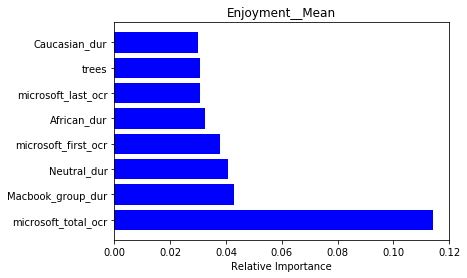

Brand_Appeal__Mean
Feature ranking:
African_dur
microsoft_first_ocr
microsoft_total_ocr
Laptop_total_ocr
Surface_group_dur
Caucasian_dur
Neutral_dur
plastic
using tools
Tablet_first_ocr
microsoft_last_ocr
Surface_group_last_ocr
length_of_ad_15
Tablet_last_ocr
Surface_group_total_ocr
Laptop_last_ocr
Laptop_dur
Age: 25-34_dur
Surface_group_first_ocr
brick
Female_dur
stressful
metal
sports
conducting business
Macbook_group_dur
running water
biking
still water
Laptop_first_ocr
Sadness_dur
grass
Eastasian_dur
Tablet_dur
microsoft_dur
sunny
asphalt
cluttered space
Male_dur
Tablet_total_ocr
warm
cold
clouds
soothing
far-away horizon
rugged scene
dirty
Happiness_dur
socializing
training
studying
research
moist
shopping
paper
spectating
boating
swimming
bathing
horizontal components
touring
exercise
driving
trees
eating
gaming
ice
diving
Age: 35-44_dur
congregating
carpet
sterile
playing
reading
climbing
medical activity
ocean
symmetrical
aged
transporting
glass
vegetation
leaves
flowers
vinyl


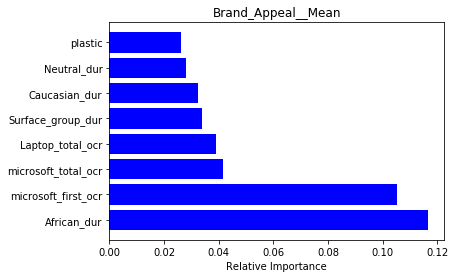

Understanding__Mean
Feature ranking:
African_dur
grass
boating
sunny
Caucasian_dur
Tablet_dur
Surface_group_dur
Laptop_first_ocr
Tablet_first_ocr
Neutral_dur
Male_dur
Tablet_total_ocr
Tablet_last_ocr
microsoft_total_ocr
Surface_group_last_ocr
Surface_group_total_ocr
vertical components
Laptop_dur
microsoft_first_ocr
shopping
Surface_group_first_ocr
soothing
Age: 35-44_dur
microsoft_dur
Age: 25-34_dur
Laptop_total_ocr
spectating
gaming
clouds
glass
Macbook_group_dur
socializing
ice
metal
Sadness_dur
Female_dur
exercise
Laptop_last_ocr
playing
carpet
driving
Eastasian_dur
microsoft_last_ocr
Happiness_dur
transporting
scary
ocean
touring
congregating
smoke
shrubbery
horizontal components
brick
sports
warm
studying
flowers
training
plastic
research
swimming
still water
dirt
trees
foliage
cold
sand
asphalt
diving
cluttered space
conducting business
medical activity
wood
snow
semi-enclosed area
reading
leaves
vegetation
railing
stressful
hiking
sterile
climbing
aged
moist
rugged scene
dry
ea

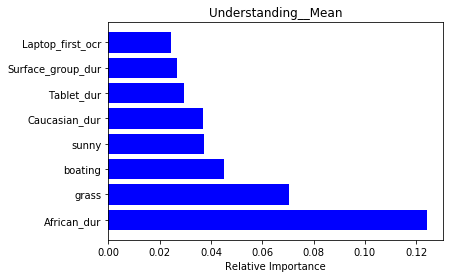

Relevance_of_Information__Mean
Feature ranking:
metal
plastic
moist
Laptop_total_ocr
African_dur
Male_dur
microsoft_total_ocr
congregating
Surface_group_last_ocr
boating
Caucasian_dur
Tablet_last_ocr
Happiness_dur
wood
Age: 25-34_dur
microsoft_first_ocr
Laptop_first_ocr
shopping
Tablet_dur
Tablet_total_ocr
microsoft_last_ocr
Tablet_first_ocr
spectating
Female_dur
Laptop_last_ocr
Neutral_dur
Eastasian_dur
Surface_group_dur
Laptop_dur
tiles
Surface_group_total_ocr
sterile
Surface_group_first_ocr
socializing
exercise
smoke
Macbook_group_dur
microsoft_dur
indoor lighting
using tools
Sadness_dur
glossy
clouds
dry
dirty
man-made
cloth
cluttered space
research
cold
transporting
touring
eating
studying
glass
ocean
rugged scene
scary
warm
Age: 35-44_dur
open area
enclosed area
gaming
working
stressful
soothing
sunny
training
flowers
carpet
length_of_ad_15
sports
medical activity
horizontal components
snow
brick
railing
no horizon
diving
reading
far-away horizon
vertical components
running water

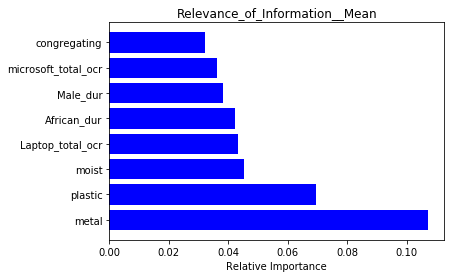

Credibility_of_Information__Mean
Feature ranking:
Macbook_group_dur
Male_dur
plastic
boating
Surface_group_last_ocr
congregating
microsoft_total_ocr
spectating
Caucasian_dur
still water
socializing
Laptop_total_ocr
Laptop_dur
Tablet_first_ocr
Tablet_total_ocr
Neutral_dur
microsoft_first_ocr
Surface_group_first_ocr
stressful
Surface_group_dur
Tablet_last_ocr
Laptop_last_ocr
leaves
Eastasian_dur
Happiness_dur
Age: 25-34_dur
ice
African_dur
Laptop_first_ocr
Tablet_dur
medical activity
Sadness_dur
microsoft_last_ocr
Female_dur
wood
microsoft_dur
metal
clouds
glass
playing
Surface_group_total_ocr
warm
length_of_ad_15
swimming
moist
diving
trees
research
cluttered space
dry
glossy
sports
dirt
reading
touring
sunny
Age: 35-44_dur
conducting business
soothing
tiles
foliage
cold
driving
training
grass
man-made
working
brick
snow
studying
vegetation
scary
vinyl
horizontal components
transporting
carpet
exercise
no horizon
vertical components
natural light
railing
asphalt
natural
cloth
running wa

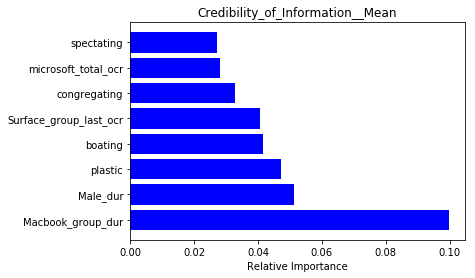

Brand_Difference__Mean
Feature ranking:
Surface_group_first_ocr
microsoft_last_ocr
length_of_ad_15
Tablet_first_ocr
Surface_group_last_ocr
plastic
Age: 25-34_dur
African_dur
microsoft_first_ocr
sports
Laptop_last_ocr
Happiness_dur
Tablet_last_ocr
Female_dur
microsoft_total_ocr
Tablet_total_ocr
brick
playing
Caucasian_dur
Neutral_dur
Laptop_total_ocr
dry
Laptop_dur
flowers
Tablet_dur
rugged scene
clouds
studying
Eastasian_dur
congregating
microsoft_dur
exercise
smoke
Surface_group_dur
still water
Macbook_group_dur
foliage
spectating
metal
Sadness_dur
scary
Male_dur
cluttered space
warm
touring
driving
grass
transporting
using tools
dirty
Laptop_first_ocr
Age: 35-44_dur
ocean
conducting business
reading
shrubbery
ice
Surface_group_total_ocr
vegetation
training
socializing
stressful
asphalt
research
sterile
trees
climbing
soothing
snow
sunny
medical activity
horizontal components
swimming
cold
boating
gaming
leaves
semi-enclosed area
shopping
diving
running water
pavement
glass
symmetrica

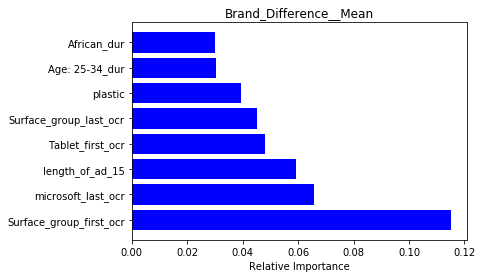

Interest_peak
Feature ranking:
microsoft_first_ocr
Neutral_dur
Surface_group_dur
Sadness_dur
Laptop_first_ocr
Age: 25-34_dur
Laptop_dur
metal
Surface_group_first_ocr
Laptop_total_ocr
Tablet_first_ocr
microsoft_dur
Tablet_last_ocr
Surface_group_last_ocr
Surface_group_total_ocr
Tablet_dur
Happiness_dur
conducting business
microsoft_total_ocr
matte
moist
Laptop_last_ocr
Female_dur
asphalt
microsoft_last_ocr
Tablet_total_ocr
still water
studying
Caucasian_dur
horizontal components
Male_dur
Eastasian_dur
touring
congregating
stressful
diving
exercise
sports
scary
swimming
brick
flowers
training
plastic
leaves
railing
boating
ocean
research
grass
cold
warm
playing
Age: 35-44_dur
reading
driving
trees
shopping
clouds
medical activity
vertical components
carpet
foliage
spectating
paper
snow
African_dur
soothing
glass
using tools
socializing
cluttered space
sunny
Macbook_group_dur
competing
symmetrical
shrubbery
vinyl
vegetation
semi-enclosed area
dry
ice
eating
length_of_ad_15
wood
climbing
ga

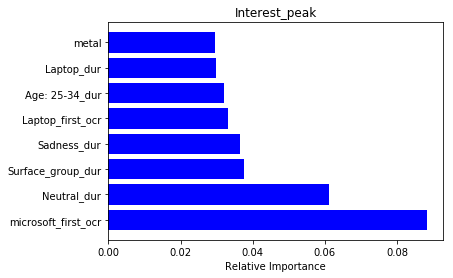

Interest_mean_score
Feature ranking:
Surface_group_first_ocr
Tablet_last_ocr
Age: 25-34_dur
Laptop_dur
symmetrical
using tools
Surface_group_dur
Male_dur
sports
Neutral_dur
shopping
still water
competing
moist
Sadness_dur
microsoft_first_ocr
Happiness_dur
Surface_group_last_ocr
Laptop_last_ocr
paper
rugged scene
Caucasian_dur
Laptop_total_ocr
African_dur
microsoft_dur
Female_dur
touring
microsoft_total_ocr
microsoft_last_ocr
horizontal components
Laptop_first_ocr
Eastasian_dur
railing
diving
Tablet_dur
smoke
Surface_group_total_ocr
socializing
dirty
Age: 35-44_dur
matte
spectating
training
playing
Tablet_first_ocr
sunny
bathing
scary
warm
metal
Macbook_group_dur
stressful
studying
exercise
vertical components
sterile
medical activity
soothing
Tablet_total_ocr
trees
driving
congregating
brick
reading
ocean
carpet
boating
research
length_of_ad_15
foliage
gaming
cold
climbing
swimming
flowers
plastic
grass
hiking
leaves
asphalt
eating
aged
praying
snow
clouds
conducting business
vegetatio

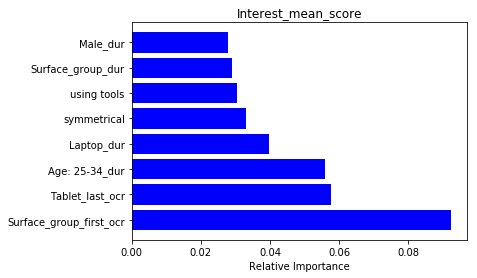

Purchase_intent
Feature ranking:
microsoft_first_ocr
shrubbery
microsoft_total_ocr
semi-enclosed area
Tablet_dur
foliage
Tablet_total_ocr
Neutral_dur
cluttered space
still water
metal
Surface_group_last_ocr
Surface_group_dur
Tablet_last_ocr
Happiness_dur
microsoft_dur
Eastasian_dur
studying
biking
gaming
Caucasian_dur
vegetation
leaves
diving
conducting business
Laptop_first_ocr
moist
Surface_group_total_ocr
Laptop_dur
Surface_group_first_ocr
Tablet_first_ocr
plastic
Laptop_total_ocr
transporting
wood
warm
Female_dur
Age: 25-34_dur
microsoft_last_ocr
vertical components
cold
Sadness_dur
eating
soothing
congregating
Laptop_last_ocr
brick
using tools
symmetrical
ocean
driving
asphalt
smoke
grass
socializing
medical activity
sunny
clouds
Male_dur
exercise
swimming
camping
research
African_dur
sports
touring
playing
aged
praying
Age: 35-44_dur
shopping
carpet
length_of_ad_15
boating
bathing
rugged scene
stressful
matte
Macbook_group_dur
training
sterile
glass
spectating
scary
ice
trees
cli

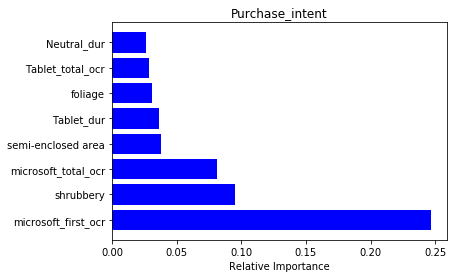

Persuasion_mean
Feature ranking:
microsoft_first_ocr
brick
Laptop_dur
stressful
boating
still water
Surface_group_dur
warm
Surface_group_total_ocr
microsoft_total_ocr
Caucasian_dur
Happiness_dur
Laptop_total_ocr
Tablet_first_ocr
Eastasian_dur
Sadness_dur
Surface_group_last_ocr
camping
soothing
Age: 25-34_dur
congregating
Surface_group_first_ocr
Laptop_first_ocr
cold
Tablet_dur
Female_dur
pavement
Neutral_dur
studying
microsoft_dur
Laptop_last_ocr
Tablet_last_ocr
Tablet_total_ocr
driving
plastic
metal
microsoft_last_ocr
diving
clouds
natural
climbing
biking
sports
research
grass
sunny
cluttered space
moist
training
African_dur
gaming
vinyl
Age: 35-44_dur
reading
Male_dur
asphalt
swimming
transporting
far-away horizon
foliage
scary
length_of_ad_15
horizontal components
ocean
aged
dry
trees
wood
playing
carpet
socializing
touring
shopping
medical activity
exercise
flowers
spectating
sterile
tiles
eating
semi-enclosed area
cloth
Macbook_group_dur
rugged scene
symmetrical
shrubbery
vertical

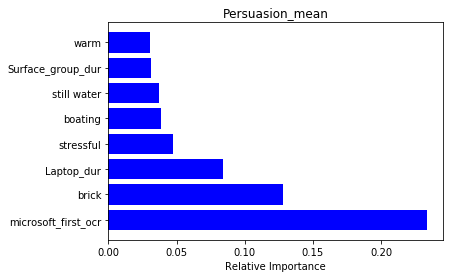

Persuasion_very_likely
Feature ranking:
microsoft_first_ocr
brick
Laptop_dur
still water
boating
stressful
Surface_group_dur
microsoft_total_ocr
Surface_group_total_ocr
warm
Tablet_first_ocr
Laptop_total_ocr
Surface_group_last_ocr
Surface_group_first_ocr
Happiness_dur
Sadness_dur
camping
congregating
Caucasian_dur
Eastasian_dur
soothing
metal
Age: 25-34_dur
Laptop_first_ocr
moist
Laptop_last_ocr
Neutral_dur
Tablet_last_ocr
microsoft_dur
Tablet_dur
cold
Female_dur
microsoft_last_ocr
asphalt
biking
pavement
plastic
clouds
studying
Tablet_total_ocr
African_dur
diving
Male_dur
far-away horizon
gaming
driving
sports
exercise
research
reading
swimming
horizontal components
scary
spectating
sunny
cluttered space
shopping
climbing
trees
Age: 35-44_dur
training
foliage
dry
flowers
transporting
vertical components
ocean
glass
socializing
hiking
grass
wood
tiles
using tools
rugged scene
vegetation
length_of_ad_15
matte
touring
sand
snow
aged
semi-enclosed area
natural
medical activity
playing
ste

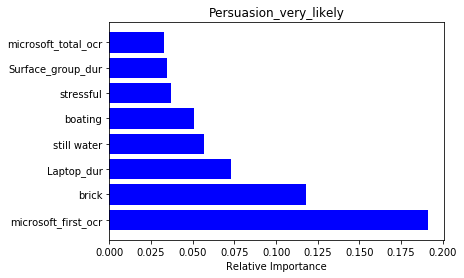

Interest_peak_frames
Feature ranking:
microsoft_first_ocr
Neutral_dur
Surface_group_dur
Sadness_dur
Laptop_first_ocr
Surface_group_first_ocr
Laptop_dur
Age: 25-34_dur
metal
Laptop_total_ocr
Tablet_first_ocr
matte
Surface_group_last_ocr
microsoft_dur
Tablet_last_ocr
Surface_group_total_ocr
Laptop_last_ocr
conducting business
Happiness_dur
moist
Tablet_dur
Tablet_total_ocr
microsoft_total_ocr
still water
Female_dur
microsoft_last_ocr
horizontal components
Eastasian_dur
studying
Male_dur
Caucasian_dur
asphalt
congregating
diving
brick
sports
stressful
exercise
touring
swimming
scary
training
railing
flowers
grass
plastic
research
boating
cold
Age: 35-44_dur
spectating
warm
playing
driving
leaves
vertical components
carpet
reading
foliage
trees
shopping
ocean
clouds
African_dur
medical activity
paper
using tools
glass
cluttered space
socializing
snow
competing
Macbook_group_dur
soothing
shrubbery
ice
sunny
vegetation
vinyl
wood
symmetrical
semi-enclosed area
gaming
dry
transporting
running

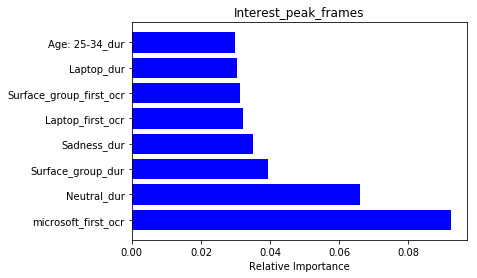

Enjoyment_vey_much
Feature ranking:
microsoft_total_ocr
microsoft_first_ocr
Surface_group_dur
microsoft_last_ocr
metal
length_of_ad_15
camping
Surface_group_last_ocr
Neutral_dur
Surface_group_first_ocr
still water
Surface_group_total_ocr
Caucasian_dur
Laptop_total_ocr
Tablet_last_ocr
Happiness_dur
plastic
Tablet_first_ocr
Laptop_last_ocr
sunny
clouds
dry
paper
Macbook_group_dur
Laptop_first_ocr
playing
Laptop_dur
training
moist
aged
Age: 25-34_dur
Sadness_dur
asphalt
microsoft_dur
Eastasian_dur
reading
medical activity
Female_dur
Tablet_dur
boating
gaming
Male_dur
using tools
Tablet_total_ocr
African_dur
natural light
conducting business
trees
diving
biking
socializing
horizontal components
running water
vinyl
studying
brick
soothing
foliage
Age: 35-44_dur
grass
touring
far-away horizon
ocean
research
warm
matte
climbing
open area
cluttered space
snow
stressful
enclosed area
sports
cold
swimming
spectating
rugged scene
exercise
congregating
driving
no horizon
man-made
leaves
competing


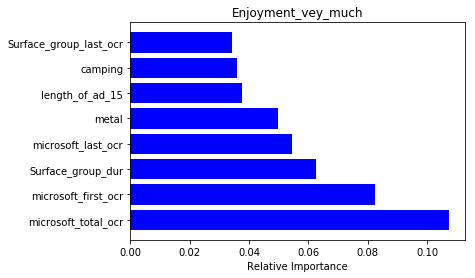

Aided_Branding_almost_anything
Feature ranking:
Surface_group_dur
Neutral_dur
Surface_group_total_ocr
Caucasian_dur
Surface_group_first_ocr
microsoft_total_ocr
microsoft_first_ocr
asphalt
Sadness_dur
carpet
microsoft_last_ocr
Tablet_total_ocr
Surface_group_last_ocr
studying
Female_dur
touring
Age: 25-34_dur
Happiness_dur
Laptop_last_ocr
Laptop_total_ocr
Laptop_first_ocr
cold
spectating
Eastasian_dur
Tablet_last_ocr
Laptop_dur
Male_dur
diving
length_of_ad_15
swimming
warm
Tablet_dur
driving
brick
microsoft_dur
scary
Tablet_first_ocr
moist
socializing
still water
natural light
African_dur
Age: 35-44_dur
transporting
horizontal components
vegetation
symmetrical
sunny
training
boating
glass
congregating
ocean
foliage
matte
sports
plastic
cluttered space
grass
snow
research
reading
shrubbery
exercise
vertical components
railing
medical activity
soothing
clouds
dry
competing
shopping
leaves
metal
sterile
sand
climbing
conducting business
using tools
Macbook_group_dur
vinyl
aged
playing
trees

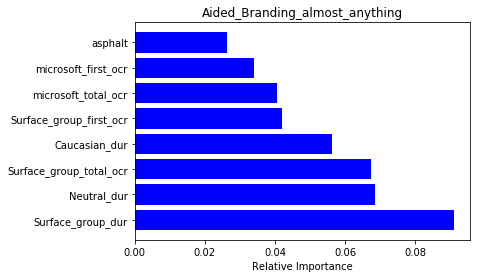

Brand_Cues_very_easily
Feature ranking:
Surface_group_dur
microsoft_first_ocr
microsoft_total_ocr
spectating
boating
Caucasian_dur
microsoft_last_ocr
plastic
Male_dur
Laptop_dur
Laptop_first_ocr
Neutral_dur
Laptop_total_ocr
Surface_group_last_ocr
Age: 35-44_dur
Laptop_last_ocr
metal
African_dur
still water
Age: 25-34_dur
Tablet_total_ocr
congregating
cold
microsoft_dur
Sadness_dur
Surface_group_first_ocr
Tablet_first_ocr
training
playing
Eastasian_dur
warm
socializing
Happiness_dur
horizontal components
dirty
sports
rugged scene
research
medical activity
sand
Female_dur
Tablet_last_ocr
soothing
transporting
Tablet_dur
driving
snow
smoke
carpet
ocean
Surface_group_total_ocr
vinyl
tiles
ice
railing
reading
stressful
leaves
Macbook_group_dur
clouds
exercise
studying
sunny
climbing
cluttered space
grass
moist
fire
touring
using tools
diving
wood
scary
swimming
glass
asphalt
brick
conducting business
dirt
vegetation
flowers
trees
paper
far-away horizon
shopping
vertical components
sterile
s

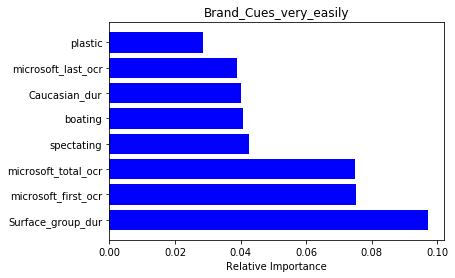

Brand_Appeal_more_appealing
Feature ranking:
microsoft_first_ocr
African_dur
Surface_group_dur
microsoft_last_ocr
microsoft_total_ocr
Caucasian_dur
Surface_group_total_ocr
Neutral_dur
length_of_ad_15
still water
Sadness_dur
Surface_group_last_ocr
biking
Surface_group_first_ocr
Laptop_total_ocr
plastic
Age: 25-34_dur
studying
metal
trees
Laptop_last_ocr
sunny
rugged scene
Tablet_first_ocr
Female_dur
clouds
microsoft_dur
Laptop_dur
Eastasian_dur
Tablet_dur
asphalt
Happiness_dur
training
running water
dry
reading
dirty
using tools
Laptop_first_ocr
medical activity
stressful
Male_dur
boating
soothing
horizontal components
paper
warm
camping
socializing
Tablet_last_ocr
Tablet_total_ocr
conducting business
sports
exercise
aged
brick
flowers
ocean
grass
congregating
cluttered space
far-away horizon
research
spectating
moist
cold
transporting
driving
carpet
bathing
touring
gaming
sterile
semi-enclosed area
diving
Age: 35-44_dur
playing
Macbook_group_dur
shopping
vegetation
tiles
swimming
symme

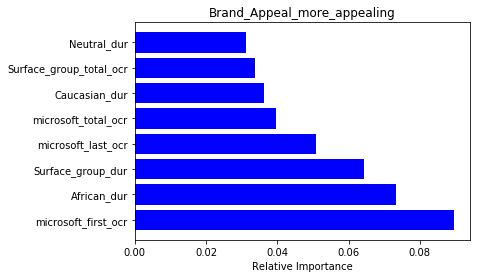

Understanding_very_easily
Feature ranking:
African_dur
boating
grass
sunny
Laptop_first_ocr
Surface_group_dur
Caucasian_dur
ice
microsoft_first_ocr
Neutral_dur
Male_dur
Tablet_dur
Tablet_last_ocr
microsoft_total_ocr
Tablet_first_ocr
Surface_group_first_ocr
Tablet_total_ocr
Macbook_group_dur
microsoft_dur
Age: 35-44_dur
Surface_group_last_ocr
Age: 25-34_dur
Surface_group_total_ocr
spectating
Laptop_dur
metal
vertical components
Laptop_total_ocr
socializing
Eastasian_dur
playing
Sadness_dur
carpet
exercise
congregating
soothing
studying
Happiness_dur
cold
microsoft_last_ocr
shopping
Laptop_last_ocr
still water
driving
Female_dur
transporting
conducting business
clouds
gaming
glass
smoke
sports
flowers
snow
horizontal components
touring
stressful
brick
training
dirt
diving
research
cluttered space
scary
ocean
medical activity
railing
asphalt
rugged scene
warm
leaves
moist
sand
reading
trees
swimming
vegetation
hiking
foliage
plastic
shrubbery
dry
dirty
vinyl
climbing
natural light
biking


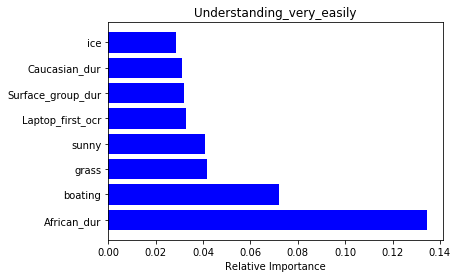

Relevance_Information_very_relevant
Feature ranking:
metal
plastic
boating
moist
microsoft_total_ocr
congregating
microsoft_first_ocr
Caucasian_dur
Laptop_total_ocr
African_dur
Male_dur
Surface_group_last_ocr
Happiness_dur
Surface_group_dur
spectating
tiles
Age: 25-34_dur
Laptop_dur
using tools
wood
Laptop_last_ocr
Eastasian_dur
microsoft_dur
Surface_group_first_ocr
sunny
Tablet_last_ocr
Tablet_dur
dirty
Tablet_total_ocr
cluttered space
Female_dur
Neutral_dur
man-made
cold
shopping
Tablet_first_ocr
indoor lighting
natural
Sadness_dur
socializing
exercise
microsoft_last_ocr
glossy
foliage
Laptop_first_ocr
cloth
open area
no horizon
sterile
enclosed area
training
dry
Surface_group_total_ocr
rugged scene
Macbook_group_dur
smoke
working
eating
transporting
far-away horizon
glass
climbing
asphalt
vertical components
Age: 35-44_dur
touring
still water
running water
soothing
gaming
research
warm
medical activity
carpet
stressful
studying
ocean
aged
matte
playing
natural light
sports
horizonta

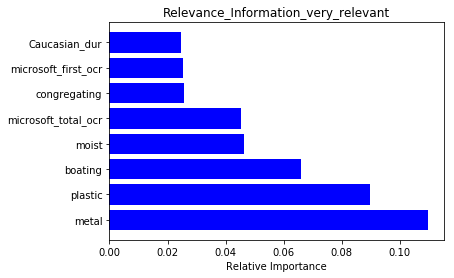

Credibility_Information_agree_strongly
Feature ranking:
Macbook_group_dur
metal
Surface_group_last_ocr
Male_dur
spectating
boating
Caucasian_dur
Tablet_total_ocr
Laptop_total_ocr
microsoft_total_ocr
Neutral_dur
microsoft_last_ocr
Tablet_last_ocr
Laptop_first_ocr
Surface_group_dur
Tablet_first_ocr
plastic
length_of_ad_15
Surface_group_first_ocr
still water
microsoft_first_ocr
Female_dur
Laptop_dur
Happiness_dur
Laptop_last_ocr
Sadness_dur
Tablet_dur
Age: 25-34_dur
socializing
congregating
medical activity
microsoft_dur
African_dur
warm
Eastasian_dur
moist
clouds
soothing
tiles
stressful
wood
dry
ice
Surface_group_total_ocr
training
cold
diving
conducting business
using tools
railing
playing
sunny
dirt
leaves
sports
flowers
Age: 35-44_dur
transporting
paper
research
touring
vegetation
studying
vinyl
reading
carpet
horizontal components
driving
swimming
glass
brick
dirty
exercise
fire
asphalt
sterile
camping
snow
grass
vertical components
climbing
gaming
bathing
rugged scene
symmetrical
o

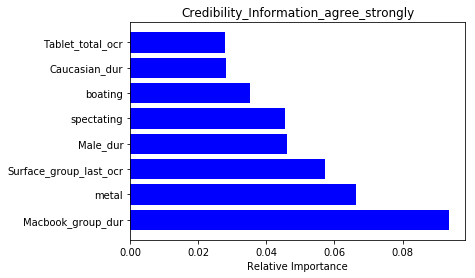

New_Information_alot
Feature ranking:
Surface_group_total_ocr
Surface_group_first_ocr
Surface_group_dur
Tablet_last_ocr
brick
Tablet_first_ocr
plastic
tiles
Neutral_dur
Tablet_total_ocr
rugged scene
microsoft_last_ocr
African_dur
microsoft_first_ocr
Laptop_total_ocr
Caucasian_dur
Surface_group_last_ocr
warm
Tablet_dur
dirty
using tools
microsoft_total_ocr
climbing
Laptop_last_ocr
length_of_ad_15
studying
Sadness_dur
Macbook_group_dur
trees
Eastasian_dur
carpet
sports
Happiness_dur
still water
Age: 25-34_dur
transporting
scary
diving
boating
microsoft_dur
metal
Laptop_first_ocr
touring
spectating
ocean
driving
cluttered space
swimming
exercise
socializing
grass
asphalt
Laptop_dur
Age: 35-44_dur
horizontal components
railing
Male_dur
sunny
cold
Female_dur
moist
playing
soothing
running water
foliage
research
far-away horizon
clouds
vegetation
reading
snow
shopping
matte
paper
competing
congregating
training
flowers
medical activity
conducting business
glass
stressful
dry
leaves
vertical 

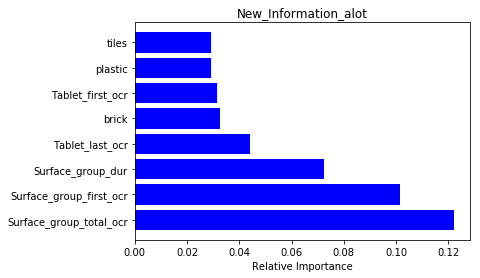

Brand_Difference_strongly
Feature ranking:
Surface_group_first_ocr
Tablet_first_ocr
plastic
microsoft_last_ocr
length_of_ad_15
Surface_group_last_ocr
Surface_group_dur
Laptop_last_ocr
microsoft_total_ocr
Happiness_dur
still water
conducting business
microsoft_first_ocr
Tablet_last_ocr
Surface_group_total_ocr
Tablet_dur
Age: 25-34_dur
brick
sports
shopping
moist
Caucasian_dur
Laptop_dur
rugged scene
Neutral_dur
African_dur
Laptop_total_ocr
Tablet_total_ocr
warm
Female_dur
metal
playing
flowers
Eastasian_dur
Sadness_dur
touring
scary
trees
congregating
microsoft_dur
Laptop_first_ocr
Male_dur
Macbook_group_dur
Age: 35-44_dur
exercise
grass
ocean
dirty
cluttered space
reading
boating
studying
transporting
climbing
dry
clouds
foliage
cold
driving
gaming
research
horizontal components
spectating
training
sunny
asphalt
carpet
using tools
biking
medical activity
leaves
vegetation
stressful
railing
socializing
pavement
soothing
sterile
diving
running water
far-away horizon
symmetrical
snow
swim

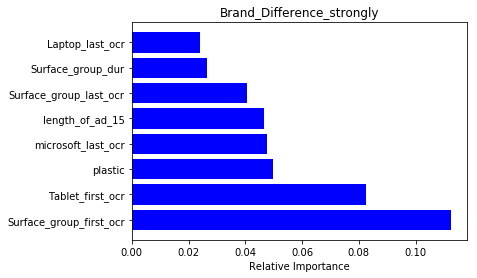

In [28]:
imp_features_rf = model.plot_feature_importance(models_27,10,y_train_27.columns,X_train_27.columns,savefig=False)

In [29]:
for i in range(len(y_test_27.columns)):
    acc_df.iloc[2:,i]= imp_features_rf[i,:10]

In [31]:
acc_df.to_excel('acc_df.xlsx')

In [33]:
len(y_train_27.columns)

26

In [39]:
from tqdm import tqdm 
shap.initjs()

In [40]:
explainer=[]
shap_values=[]
for i in tqdm(range(26)):
    explainer.append(shap.TreeExplainer(models_27[i]))
    shap_values.append(explainer[-1].shap_values(X_train_27))
    print(i)

  4%|▍         | 1/26 [00:02<01:12,  2.92s/it]

0


  8%|▊         | 2/26 [00:17<02:36,  6.53s/it]

1


 12%|█▏        | 3/26 [00:23<02:25,  6.35s/it]

2


 15%|█▌        | 4/26 [00:40<03:24,  9.31s/it]

3


 19%|█▉        | 5/26 [00:49<03:16,  9.36s/it]

4


 23%|██▎       | 6/26 [01:02<03:31, 10.60s/it]

5


 27%|██▋       | 7/26 [01:16<03:37, 11.44s/it]

6


 31%|███       | 8/26 [01:24<03:09, 10.54s/it]

7


 35%|███▍      | 9/26 [01:31<02:39,  9.39s/it]

8


 38%|███▊      | 10/26 [01:35<02:03,  7.73s/it]

9


 42%|████▏     | 11/26 [01:54<02:49, 11.27s/it]

10


 46%|████▌     | 12/26 [02:04<02:31, 10.85s/it]

11


 50%|█████     | 13/26 [02:16<02:25, 11.17s/it]

12


 54%|█████▍    | 14/26 [02:34<02:38, 13.18s/it]

13


 58%|█████▊    | 15/26 [02:41<02:04, 11.29s/it]

14


 62%|██████▏   | 16/26 [03:11<02:48, 16.88s/it]

15


 65%|██████▌   | 17/26 [03:34<02:49, 18.88s/it]

16


 69%|██████▉   | 18/26 [03:57<02:40, 20.05s/it]

17


 73%|███████▎  | 19/26 [04:18<02:21, 20.18s/it]

18


 77%|███████▋  | 20/26 [04:40<02:04, 20.71s/it]

19


 81%|████████  | 21/26 [05:03<01:46, 21.37s/it]

20


 85%|████████▍ | 22/26 [05:26<01:27, 21.92s/it]

21


 88%|████████▊ | 23/26 [05:49<01:07, 22.45s/it]

22


 92%|█████████▏| 24/26 [06:12<00:44, 22.38s/it]

23


100%|██████████| 26/26 [06:55<00:00, 21.97s/it]

24
25


In [41]:
import matplotlib.pyplot as plt

100%|██████████| 26/26 [00:15<00:00,  1.72it/s]


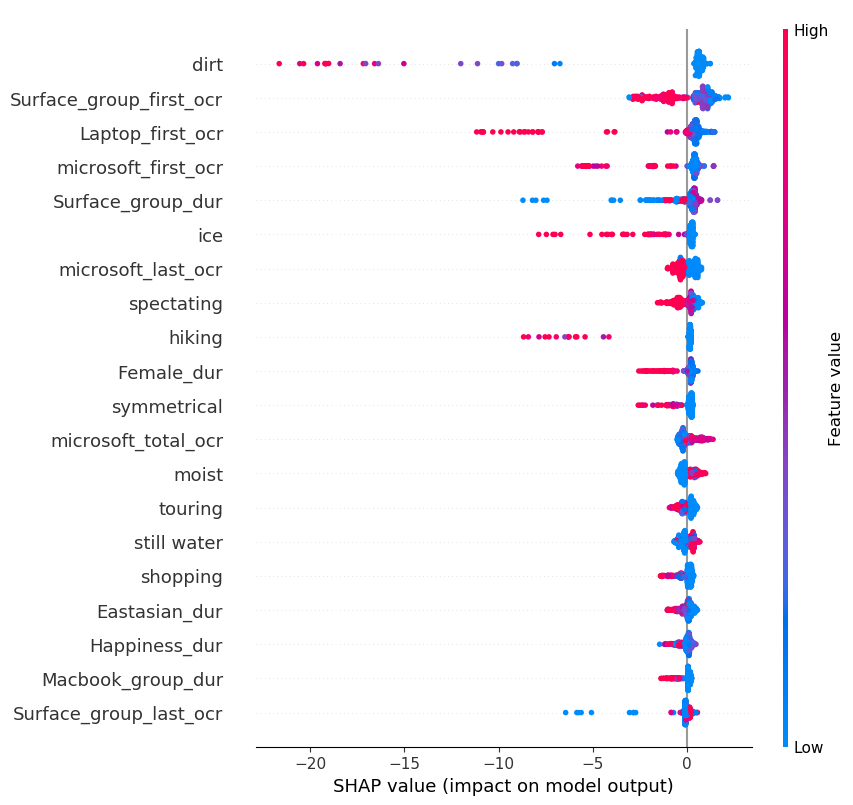

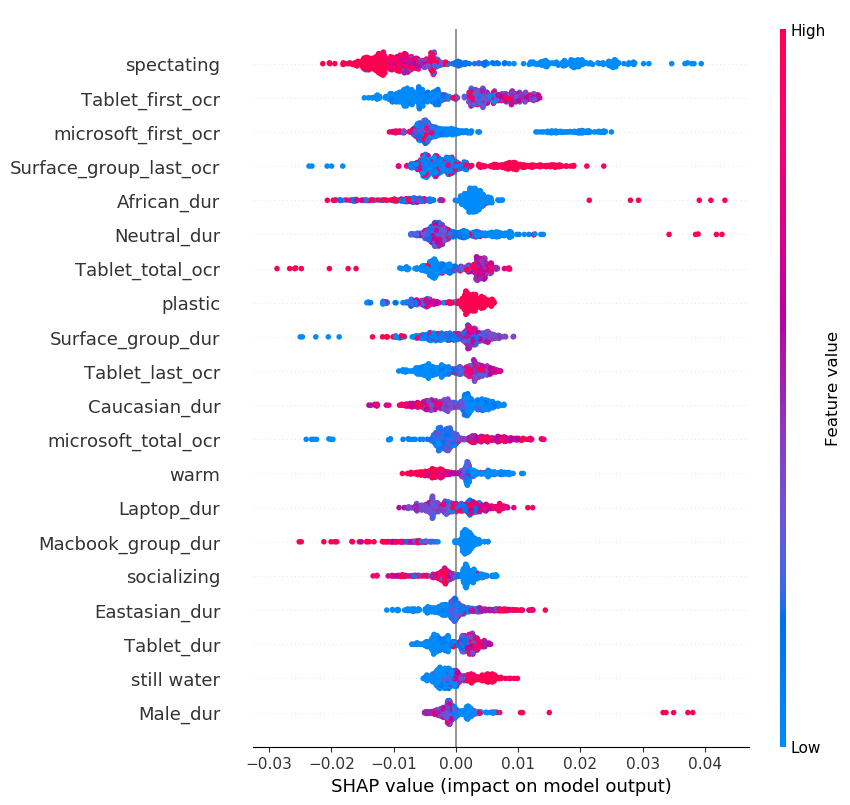

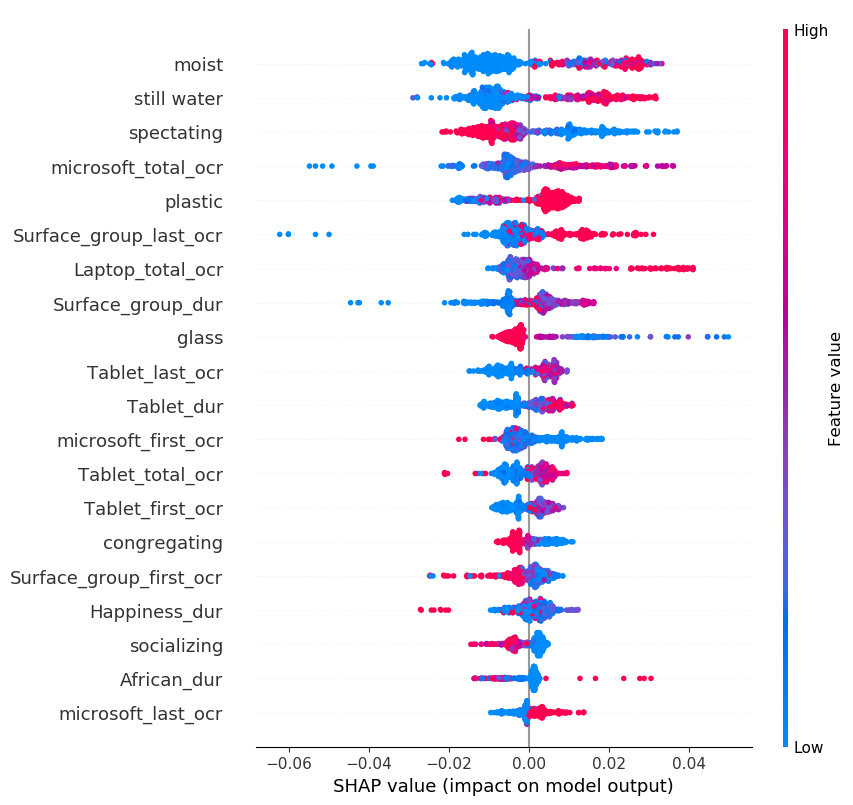

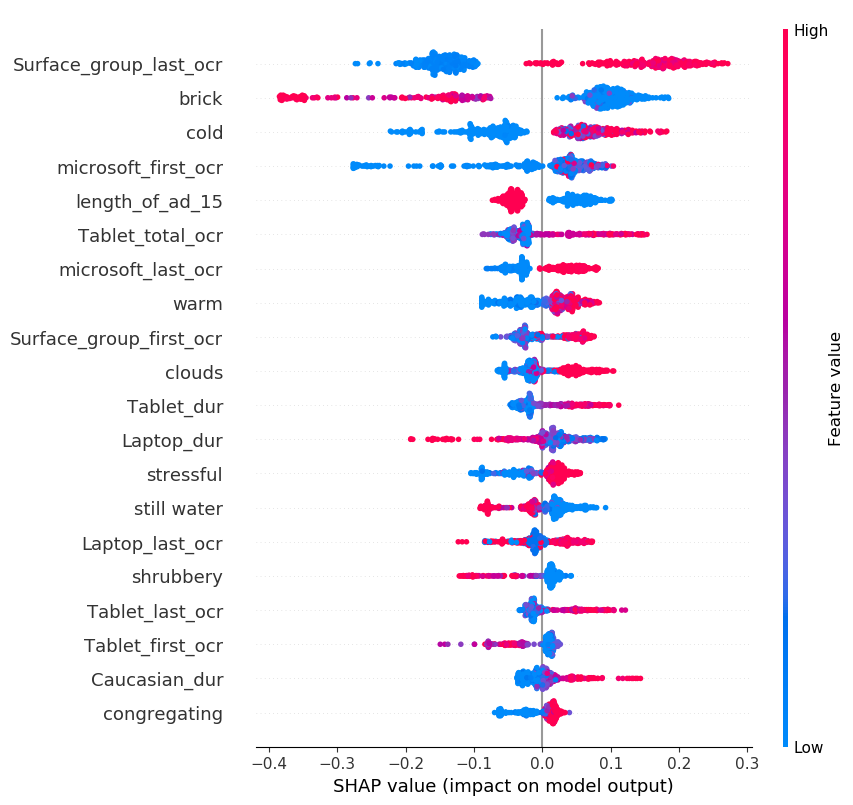

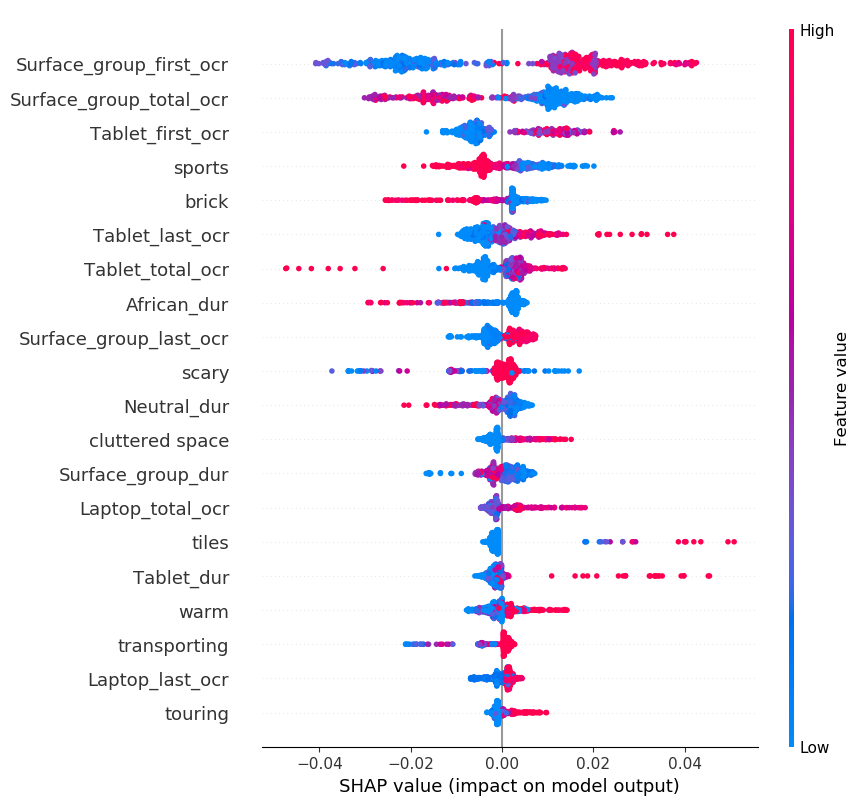

...

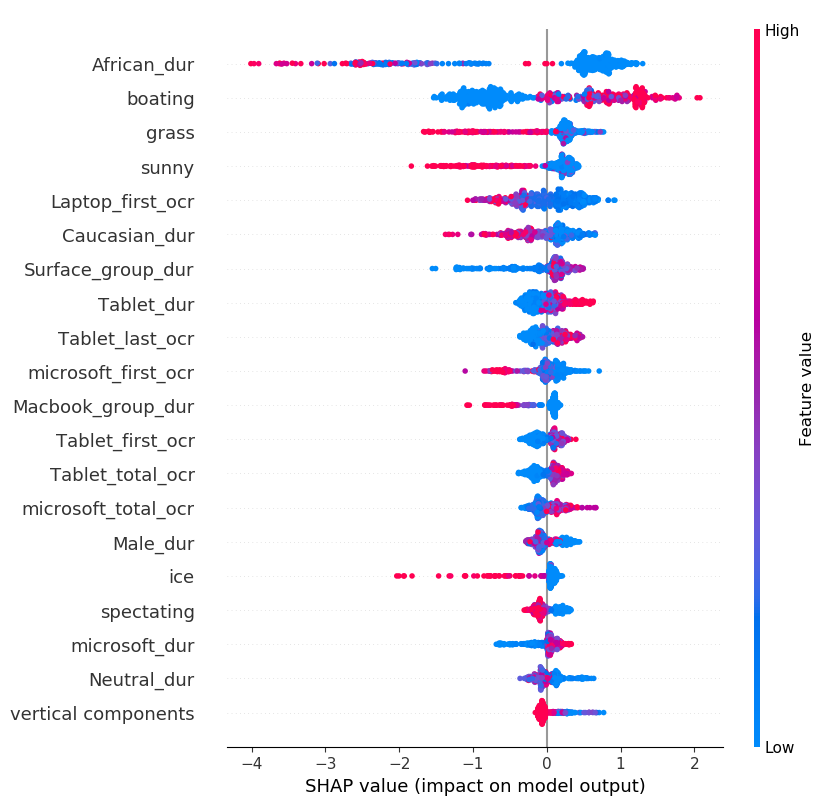

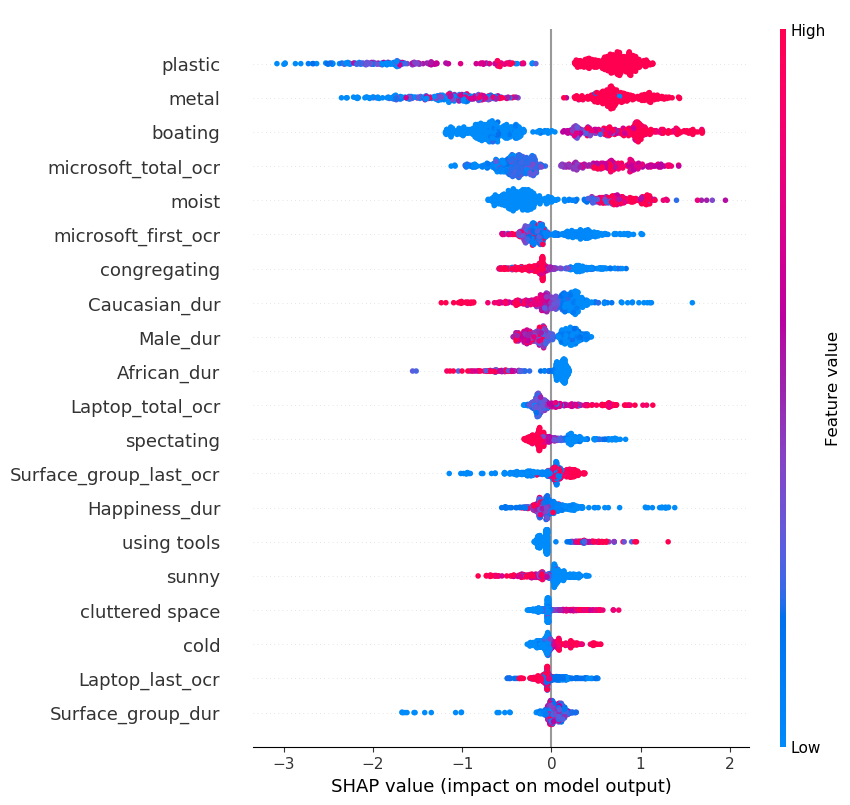

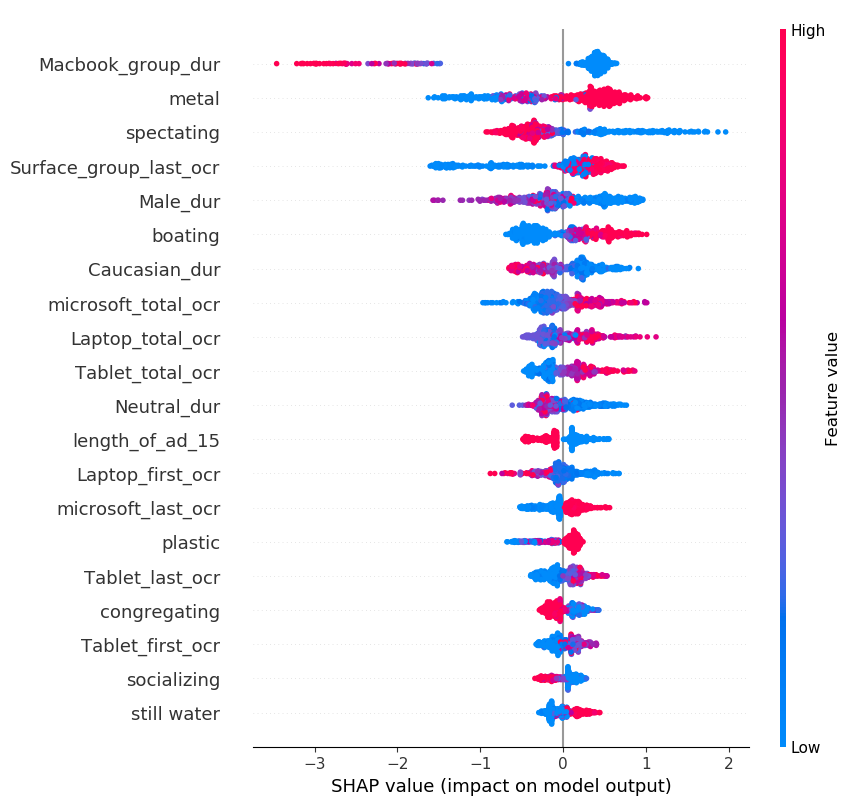

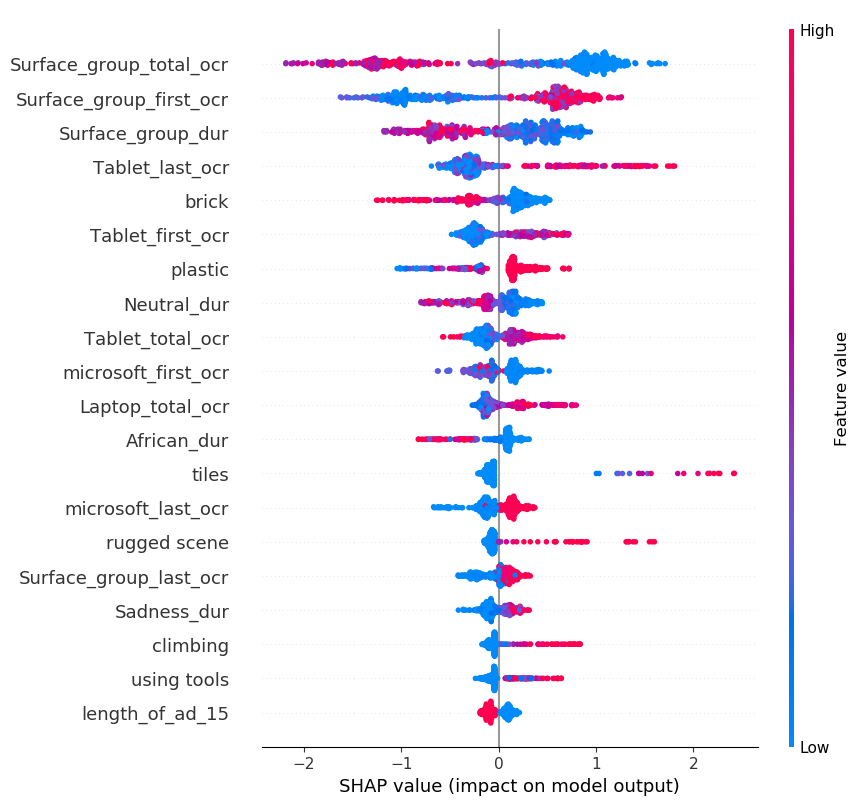

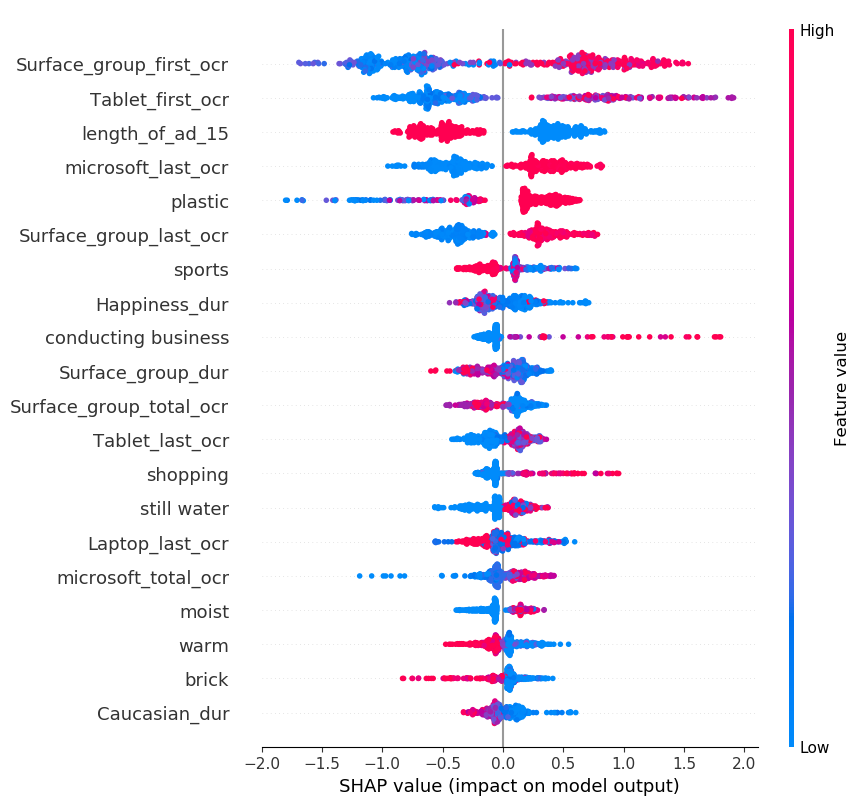

In [44]:
for i in tqdm(range(26)):
    plt.figure()
    shap.summary_plot(shap_values[i],X_train_27,show=False)
    plt.savefig('./Version_6/Surface/shap_rf/'+y_train_27.columns[i]+'.png',bbox_inches='tight')

## XGB Model

In [35]:
model_xgb = Model('xgb')
print("------------------------ 17 XGB Models Training ----------------------------\n")
models_xgb_27,acc_df_xgb = model_xgb.train(X_train_27,y_train_27,X_test_27,y_test_27,metrics='r2',plot_error=False)

------------------------ 17 XGB Models Training ----------------------------

Unaided_Branding


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    5.0s remaining:    7.6s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    6.9s finished


For training set
r2_score: 0.935675
For test set
r2_score: 0.892283


Brand_Cues__Mean


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.8s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.7s finished


For training set
r2_score: 0.814821
For test set
r2_score: 0.939643


Aided_Branding__Mean


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    1.5s remaining:    2.2s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.0s finished


For training set
r2_score: 0.868095
For test set
r2_score: 0.934643


Active_Involvement__Mean


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.6s remaining:    3.9s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    3.6s finished


For training set
r2_score: 0.937866
For test set
r2_score: 0.893835


New_Information__Mean


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    1.9s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.7s finished


For training set
r2_score: 0.947945
For test set
r2_score: 0.955199


Enjoyment__Mean


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    4.0s remaining:    5.9s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    5.5s finished


For training set
r2_score: 0.929523
For test set
r2_score: 0.942687


Brand_Appeal__Mean


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    3.9s remaining:    5.9s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    4.6s finished


For training set
r2_score: 0.942803
For test set
r2_score: 0.955776


Understanding__Mean


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    3.2s remaining:    4.9s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    4.4s finished


For training set
r2_score: 0.913563
For test set
r2_score: 0.959647


Relevance_of_Information__Mean


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    1.9s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.3s finished


For training set
r2_score: 0.946087
For test set
r2_score: 0.964497


Credibility_of_Information__Mean


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.0s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.7s finished


For training set
r2_score: 0.937552
For test set
r2_score: 0.947410


Brand_Difference__Mean


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    1.7s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.0s finished


For training set
r2_score: 0.937557
For test set
r2_score: 0.946485


Interest_peak


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.1s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.9s finished


For training set
r2_score: 0.859339
For test set
r2_score: 0.848941


Interest_mean_score


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    1.8s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.4s finished


For training set
r2_score: 0.898545
For test set
r2_score: 0.905495


Purchase_intent


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.0s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.7s finished


For training set
r2_score: 0.956351
For test set
r2_score: 0.958778


Persuasion_mean


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    3.0s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    4.0s finished


For training set
r2_score: 0.941366
For test set
r2_score: 0.897975


Persuasion_very_likely


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    3.1s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    4.1s finished


For training set
r2_score: 0.940942
For test set
r2_score: 0.908240


Interest_peak_frames


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    3.4s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    4.5s finished


For training set
r2_score: 0.875633
For test set
r2_score: 0.861743


Enjoyment_vey_much


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.9s remaining:    4.4s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    3.9s finished


For training set
r2_score: 0.933530
For test set
r2_score: 0.935156


Aided_Branding_almost_anything


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    3.8s remaining:    5.8s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    4.7s finished


For training set
r2_score: 0.905114
For test set
r2_score: 0.892414


Brand_Cues_very_easily


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.9s remaining:    4.3s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    3.8s finished


For training set
r2_score: 0.884308
For test set
r2_score: 0.947336


Brand_Appeal_more_appealing


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.7s remaining:    4.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    3.7s finished


For training set
r2_score: 0.937961
For test set
r2_score: 0.962662


Understanding_very_easily


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.6s remaining:    3.8s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    3.5s finished


For training set
r2_score: 0.929263
For test set
r2_score: 0.973832


Relevance_Information_very_relevant


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    3.0s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    3.9s finished


For training set
r2_score: 0.950771
For test set
r2_score: 0.977583


Credibility_Information_agree_strongly


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.6s remaining:    3.8s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    3.5s finished


For training set
r2_score: 0.947779
For test set
r2_score: 0.960710


New_Information_alot


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.6s remaining:    4.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    3.6s finished


For training set
r2_score: 0.950309
For test set
r2_score: 0.975476


Brand_Difference_strongly


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.8s remaining:    4.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    3.7s finished


For training set
r2_score: 0.945289
For test set
r2_score: 0.947718




Unaided_Branding
dirt
hiking
pavement
bathing
cluttered space
ice
eating
aged
Laptop_first_ocr
dirty
microsoft_first_ocr
rugged scene
leaves
trees
symmetrical
paper
spectating
Surface_group_last_ocr
competing
Surface_group_dur
asphalt
Surface_group_total_ocr
Laptop_last_ocr
Surface_group_first_ocr
gaming
vinyl
moist
training
warm
driving
Tablet_last_ocr
snow
soothing
touring
still water
shopping
using tools
boating
microsoft_last_ocr
clouds
vegetation
diving
Female_dur
Macbook_group_dur
microsoft_dur
far-away horizon
flowers
ocean
Happiness_dur
sand
research
running water
Tablet_dur
Tablet_total_ocr
climbing
exercise
plastic
scary
Laptop_dur
Sadness_dur
Laptop_total_ocr
fire
Caucasian_dur
sports
brick
transporting
semi-enclosed area
microsoft_total_ocr
vertical components
reading
Age: 35-44_dur
sunny
conducting business
African_dur
socializing
length_of_ad_15
cold
matte
Male_dur
stressful
Tablet_first_ocr
Age: 25-34_dur
grass
smoke
glass
railing
foliage
medical activity
biking
man-made

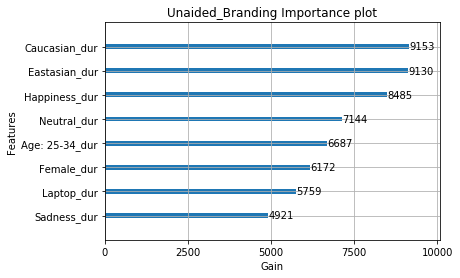

Brand_Cues__Mean
spectating
sand
glossy
Macbook_group_dur
natural
plastic
African_dur
snow
tiles
Tablet_first_ocr
driving
fire
ice
Tablet_total_ocr
dirt
Surface_group_last_ocr
microsoft_first_ocr
carpet
cold
glass
microsoft_last_ocr
shopping
conducting business
rugged scene
hiking
still water
microsoft_total_ocr
boating
playing
indoor lighting
Surface_group_dur
socializing
Male_dur
matte
Tablet_dur
warm
Surface_group_total_ocr
studying
leaves
Neutral_dur
Tablet_last_ocr
training
smoke
transporting
aged
Caucasian_dur
man-made
scary
soothing
grass
shrubbery
no horizon
vinyl
foliage
sports
bathing
congregating
Laptop_last_ocr
wood
length_of_ad_15
swimming
dry
Laptop_dur
horizontal components
Laptop_total_ocr
exercise
diving
Surface_group_first_ocr
brick
running water
cluttered space
dirty
natural light
working
Age: 35-44_dur
vegetation
Eastasian_dur
ocean
microsoft_dur
far-away horizon
metal
medical activity
clouds
paper
Age: 25-34_dur
vertical components
biking
moist
gaming
Laptop_first_

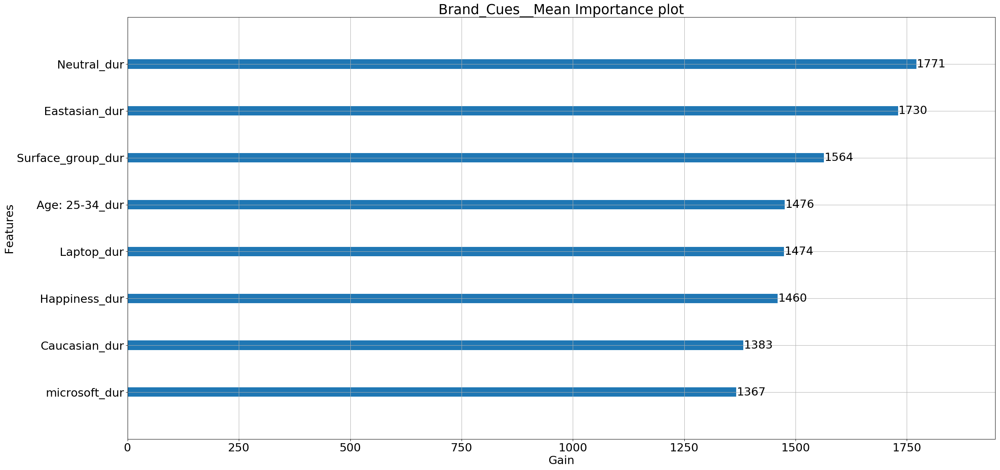

Aided_Branding__Mean
moist
still water
enclosed area
plastic
smoke
length_of_ad_15
glass
spectating
man-made
shopping
congregating
glossy
microsoft_total_ocr
cloth
ice
Tablet_total_ocr
African_dur
sand
indoor lighting
fire
Surface_group_last_ocr
no horizon
Laptop_total_ocr
microsoft_last_ocr
leaves
scary
Surface_group_total_ocr
snow
open area
Tablet_dur
Surface_group_dur
Tablet_first_ocr
socializing
brick
Surface_group_first_ocr
biking
shrubbery
dirt
Tablet_last_ocr
far-away horizon
transporting
dry
hiking
sports
Age: 25-34_dur
bathing
exercise
stressful
Laptop_dur
clouds
Laptop_last_ocr
swimming
Sadness_dur
microsoft_dur
Male_dur
Happiness_dur
diving
touring
natural
training
carpet
semi-enclosed area
grass
soothing
Macbook_group_dur
Female_dur
Neutral_dur
metal
microsoft_first_ocr
competing
ocean
Eastasian_dur
foliage
railing
boating
Caucasian_dur
studying
warm
aged
playing
cold
symmetrical
research
medical activity
driving
wood
Age: 35-44_dur
matte
using tools
Laptop_first_ocr
horizo

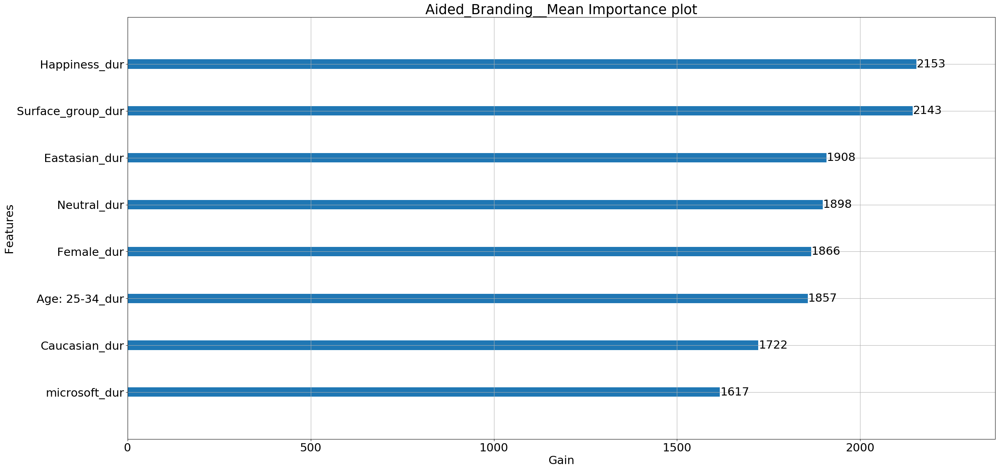

Active_Involvement__Mean
brick
length_of_ad_15
cold
Surface_group_last_ocr
still water
microsoft_first_ocr
camping
boating
clouds
gaming
stressful
metal
Tablet_total_ocr
Laptop_dur
Tablet_first_ocr
tiles
Laptop_last_ocr
congregating
microsoft_last_ocr
natural
shrubbery
wood
warm
foliage
running water
climbing
microsoft_total_ocr
plastic
Surface_group_total_ocr
trees
leaves
grass
Tablet_dur
smoke
Female_dur
diving
competing
paper
Surface_group_first_ocr
semi-enclosed area
dry
fire
rugged scene
aged
Age: 25-34_dur
pavement
Laptop_total_ocr
dirty
sunny
railing
Surface_group_dur
driving
moist
Eastasian_dur
biking
vegetation
swimming
vertical components
far-away horizon
soothing
microsoft_dur
Caucasian_dur
studying
Male_dur
Tablet_last_ocr
African_dur
socializing
training
touring
man-made
Sadness_dur
sports
matte
asphalt
horizontal components
Laptop_first_ocr
vinyl
snow
ice
Neutral_dur
shopping
research
reading
bathing
spectating
ocean
exercise
medical activity
cluttered space
transporting


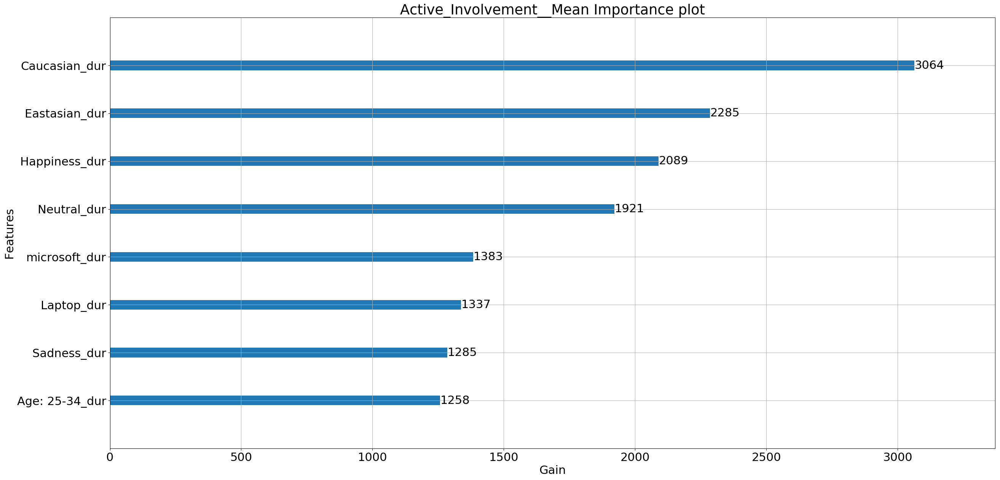

New_Information__Mean
scary
brick
touring
vertical components
transporting
Surface_group_total_ocr
smoke
length_of_ad_15
studying
Tablet_first_ocr
competing
Surface_group_first_ocr
Tablet_last_ocr
dry
Tablet_dur
African_dur
Surface_group_last_ocr
microsoft_last_ocr
working
glossy
rugged scene
sports
warm
dirty
tiles
no horizon
Laptop_total_ocr
Tablet_total_ocr
microsoft_total_ocr
flowers
natural
plastic
man-made
enclosed area
cloth
grass
soothing
semi-enclosed area
vegetation
railing
ocean
Surface_group_dur
far-away horizon
driving
exercise
Age: 25-34_dur
conducting business
Sadness_dur
carpet
Laptop_last_ocr
natural light
leaves
sunny
vinyl
congregating
gaming
Neutral_dur
still water
cluttered space
running water
foliage
training
Macbook_group_dur
Caucasian_dur
clouds
microsoft_first_ocr
pavement
indoor lighting
research
bathing
using tools
boating
shopping
matte
open area
socializing
shrubbery
aged
Age: 35-44_dur
praying
cold
trees
dirt
playing
eating
Laptop_first_ocr
asphalt
Laptop_

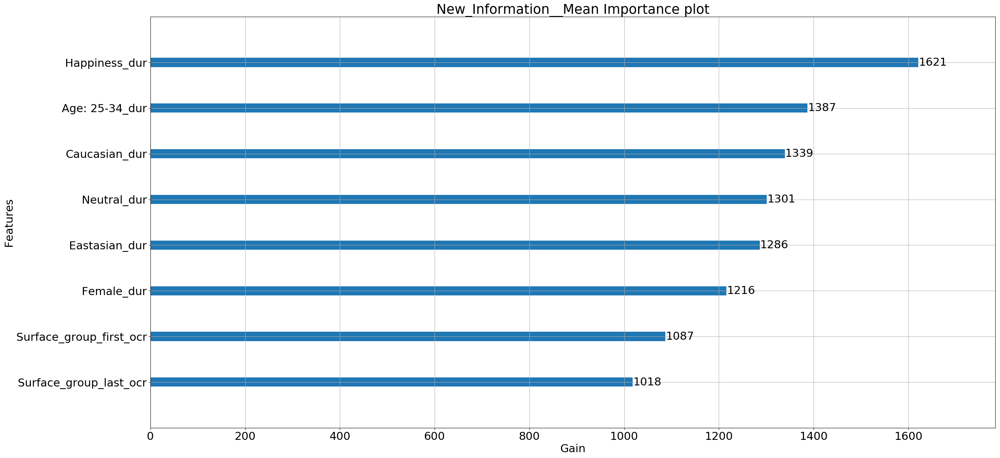

Enjoyment__Mean
camping
aged
gaming
far-away horizon
trees
length_of_ad_15
plastic
playing
sunny
bathing
Macbook_group_dur
Neutral_dur
microsoft_last_ocr
microsoft_total_ocr
rugged scene
natural
Tablet_first_ocr
climbing
soothing
clouds
African_dur
Surface_group_last_ocr
dry
man-made
Surface_group_first_ocr
cloth
enclosed area
studying
Surface_group_total_ocr
Surface_group_dur
moist
paper
open area
training
scary
vertical components
using tools
foliage
reading
wood
touring
natural light
sports
exercise
congregating
Caucasian_dur
Laptop_total_ocr
vinyl
Laptop_last_ocr
carpet
boating
running water
transporting
dirt
flowers
brick
diving
research
Age: 25-34_dur
shrubbery
microsoft_first_ocr
swimming
Male_dur
Happiness_dur
Tablet_dur
medical activity
socializing
Laptop_dur
competing
Laptop_first_ocr
cold
smoke
ocean
Tablet_last_ocr
Female_dur
conducting business
fire
grass
Sadness_dur
metal
microsoft_dur
driving
asphalt
semi-enclosed area
stressful
still water
cluttered space
matte
vegetati

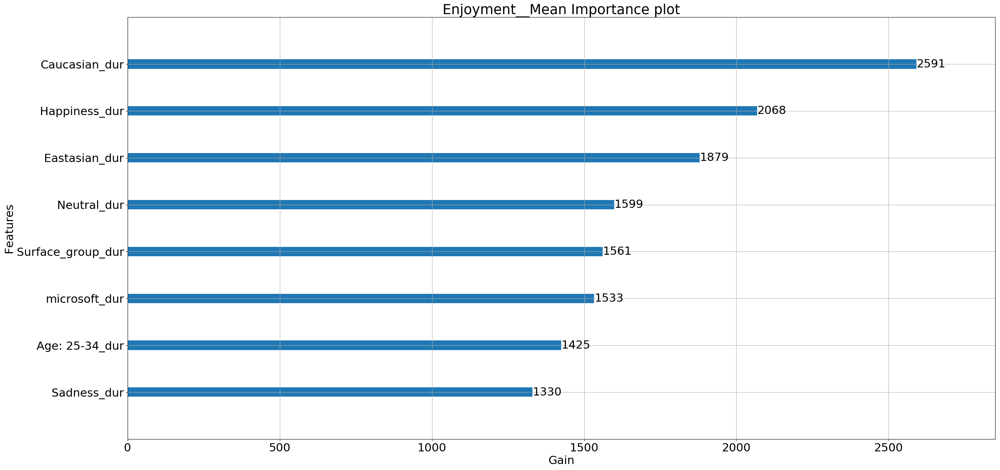

Brand_Appeal__Mean
length_of_ad_15
biking
glossy
cloth
rugged scene
African_dur
dirty
paper
Macbook_group_dur
tiles
conducting business
bathing
running water
microsoft_first_ocr
far-away horizon
microsoft_last_ocr
stressful
gaming
using tools
Tablet_first_ocr
Surface_group_total_ocr
Tablet_last_ocr
plastic
boating
sports
sunny
clouds
Neutral_dur
smoke
metal
Surface_group_last_ocr
grass
moist
aged
soothing
reading
Age: 25-34_dur
Caucasian_dur
camping
cold
Laptop_last_ocr
Surface_group_dur
microsoft_total_ocr
climbing
driving
Laptop_total_ocr
Tablet_dur
studying
congregating
Sadness_dur
warm
semi-enclosed area
still water
railing
dirt
touring
dry
fire
Female_dur
Surface_group_first_ocr
brick
Tablet_total_ocr
trees
natural
diving
socializing
carpet
sterile
vinyl
ocean
Laptop_first_ocr
snow
foliage
medical activity
swimming
Laptop_dur
hiking
wood
Male_dur
flowers
leaves
transporting
Age: 35-44_dur
microsoft_dur
cluttered space
exercise
vegetation
scary
horizontal components
spectating
play

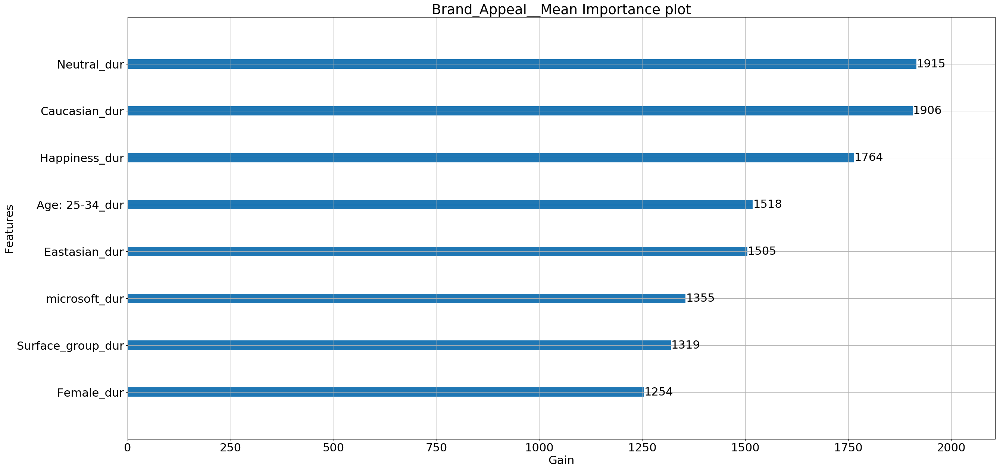

Understanding__Mean
hiking
smoke
ice
grass
shopping
boating
sunny
Macbook_group_dur
natural light
African_dur
driving
spectating
Surface_group_dur
gaming
swimming
semi-enclosed area
vertical components
Tablet_last_ocr
socializing
soothing
brick
Age: 35-44_dur
shrubbery
bathing
Tablet_dur
Tablet_total_ocr
carpet
Laptop_first_ocr
transporting
Surface_group_total_ocr
natural
scary
studying
clouds
wood
stressful
metal
fire
ocean
Caucasian_dur
Surface_group_first_ocr
exercise
playing
touring
microsoft_dur
plastic
Tablet_first_ocr
aged
Neutral_dur
congregating
microsoft_total_ocr
Sadness_dur
sand
horizontal components
glass
asphalt
Surface_group_last_ocr
Age: 25-34_dur
diving
matte
dirty
flowers
Male_dur
leaves
Laptop_total_ocr
dirt
dry
microsoft_first_ocr
sports
biking
microsoft_last_ocr
Laptop_last_ocr
vegetation
trees
rugged scene
Laptop_dur
foliage
still water
competing
railing
warm
running water
Female_dur
cluttered space
snow
Happiness_dur
cold
training
length_of_ad_15
research
cloth
f

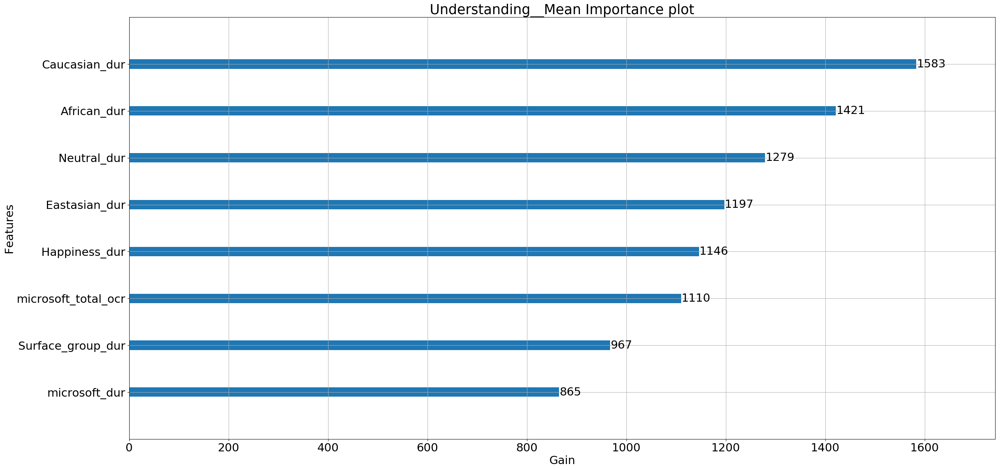

Relevance_of_Information__Mean
metal
plastic
glossy
tiles
no horizon
congregating
open area
enclosed area
African_dur
length_of_ad_15
moist
boating
Laptop_total_ocr
man-made
indoor lighting
Surface_group_last_ocr
working
cloth
natural
wood
using tools
dry
bathing
shopping
Male_dur
far-away horizon
microsoft_total_ocr
spectating
gaming
aged
rugged scene
brick
Tablet_last_ocr
sunny
trees
Tablet_total_ocr
leaves
microsoft_last_ocr
socializing
dirty
clouds
Macbook_group_dur
still water
touring
Laptop_last_ocr
Caucasian_dur
Surface_group_total_ocr
Tablet_first_ocr
reading
glass
eating
exercise
natural light
studying
Tablet_dur
Age: 25-34_dur
conducting business
sterile
foliage
cold
competing
Laptop_first_ocr
Laptop_dur
hiking
vertical components
camping
smoke
Surface_group_first_ocr
paper
Surface_group_dur
playing
training
dirt
Happiness_dur
vinyl
soothing
microsoft_first_ocr
horizontal components
praying
railing
Neutral_dur
medical activity
semi-enclosed area
diving
matte
grass
Female_dur


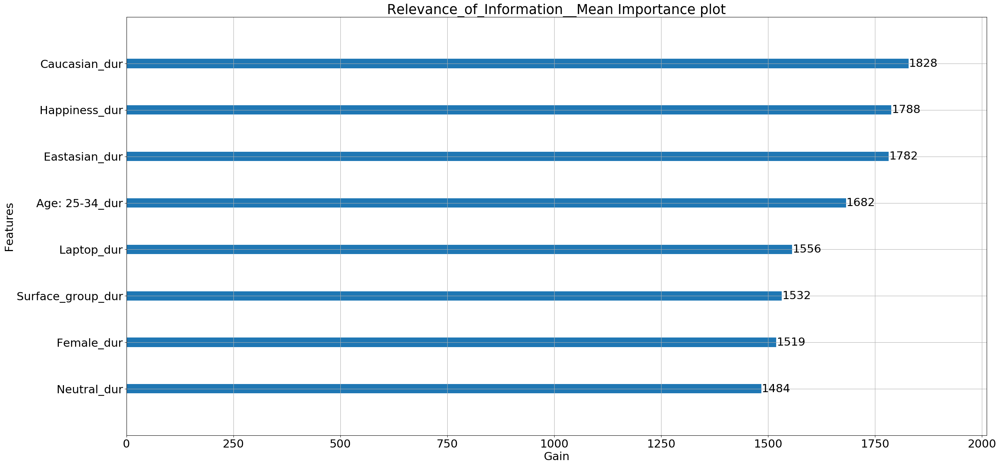

Credibility_of_Information__Mean
natural
Macbook_group_dur
congregating
open area
working
glossy
enclosed area
man-made
no horizon
plastic
spectating
dirt
cloth
still water
ice
smoke
length_of_ad_15
running water
moist
bathing
wood
leaves
stressful
Tablet_total_ocr
Tablet_last_ocr
Surface_group_last_ocr
microsoft_total_ocr
Caucasian_dur
far-away horizon
boating
aged
Male_dur
socializing
dry
Tablet_first_ocr
Laptop_total_ocr
swimming
Laptop_first_ocr
medical activity
camping
microsoft_last_ocr
warm
Surface_group_dur
trees
African_dur
training
rugged scene
using tools
conducting business
soothing
Surface_group_first_ocr
tiles
Laptop_last_ocr
studying
playing
Tablet_dur
gaming
clouds
microsoft_first_ocr
snow
diving
vegetation
climbing
biking
paper
Laptop_dur
Surface_group_total_ocr
dirty
matte
Neutral_dur
sunny
flowers
Sadness_dur
scary
cold
microsoft_dur
cluttered space
fire
grass
metal
sports
Happiness_dur
reading
shopping
driving
vinyl
railing
asphalt
touring
Age: 25-34_dur
carpet
symm

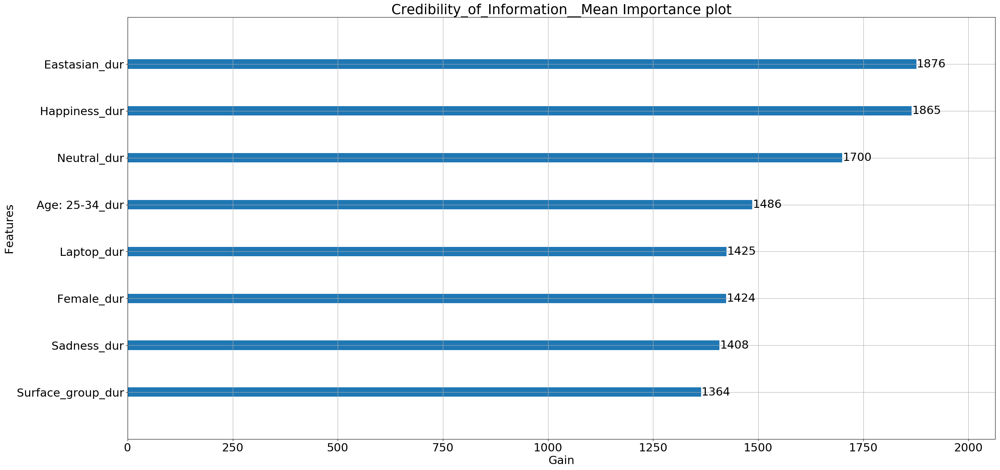

Brand_Difference__Mean
length_of_ad_15
Tablet_first_ocr
Surface_group_first_ocr
Macbook_group_dur
microsoft_last_ocr
plastic
rugged scene
flowers
dry
Surface_group_last_ocr
smoke
African_dur
scary
playing
sports
ice
conducting business
Tablet_total_ocr
dirty
Tablet_last_ocr
bathing
Age: 25-34_dur
microsoft_total_ocr
brick
natural
transporting
studying
clouds
gaming
congregating
shopping
driving
swimming
wood
touring
Laptop_total_ocr
grass
diving
socializing
Laptop_last_ocr
Tablet_dur
still water
foliage
leaves
glass
using tools
sunny
trees
microsoft_first_ocr
running water
snow
vegetation
railing
Laptop_dur
sand
ocean
warm
Surface_group_dur
Happiness_dur
metal
symmetrical
Female_dur
spectating
exercise
Caucasian_dur
boating
Surface_group_total_ocr
research
Neutral_dur
semi-enclosed area
stressful
medical activity
fire
cluttered space
hiking
training
Male_dur
asphalt
shrubbery
dirt
soothing
pavement
climbing
Laptop_first_ocr
moist
microsoft_dur
Age: 35-44_dur
natural light
matte
cold
bi

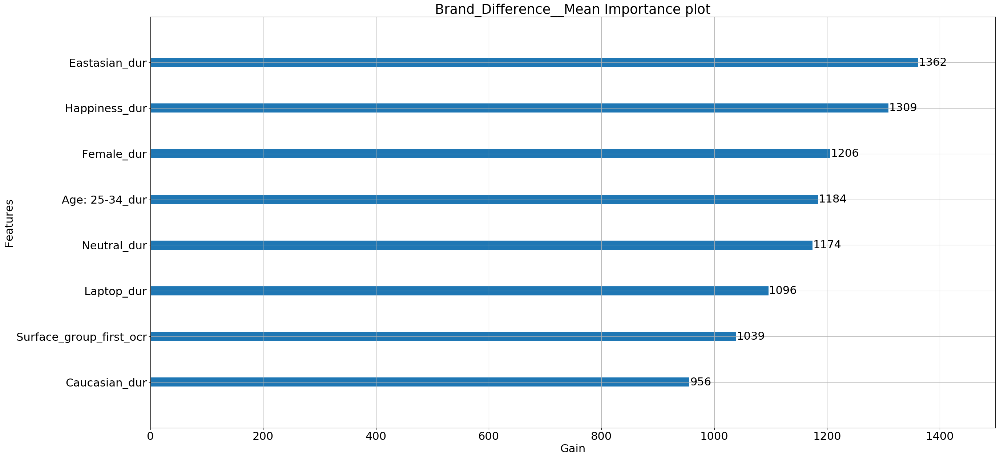

Interest_peak
glossy
matte
scary
metal
moist
plastic
studying
leaves
vertical components
indoor lighting
congregating
working
microsoft_first_ocr
conducting business
enclosed area
microsoft_last_ocr
asphalt
still water
far-away horizon
ocean
Tablet_total_ocr
foliage
swimming
man-made
Tablet_dur
glass
sports
length_of_ad_15
Tablet_last_ocr
brick
touring
Surface_group_last_ocr
Tablet_first_ocr
medical activity
paper
cluttered space
shopping
Surface_group_first_ocr
training
soothing
Surface_group_total_ocr
competing
snow
Surface_group_dur
ice
Laptop_total_ocr
clouds
pavement
cloth
horizontal components
Laptop_last_ocr
gaming
grass
wood
stressful
symmetrical
Laptop_dur
using tools
boating
playing
dry
bathing
exercise
sunny
natural light
Sadness_dur
microsoft_total_ocr
spectating
semi-enclosed area
trees
open area
sterile
diving
sand
praying
Neutral_dur
Age: 25-34_dur
Laptop_first_ocr
transporting
socializing
flowers
climbing
vegetation
dirt
microsoft_dur
carpet
driving
research
Macbook_gro

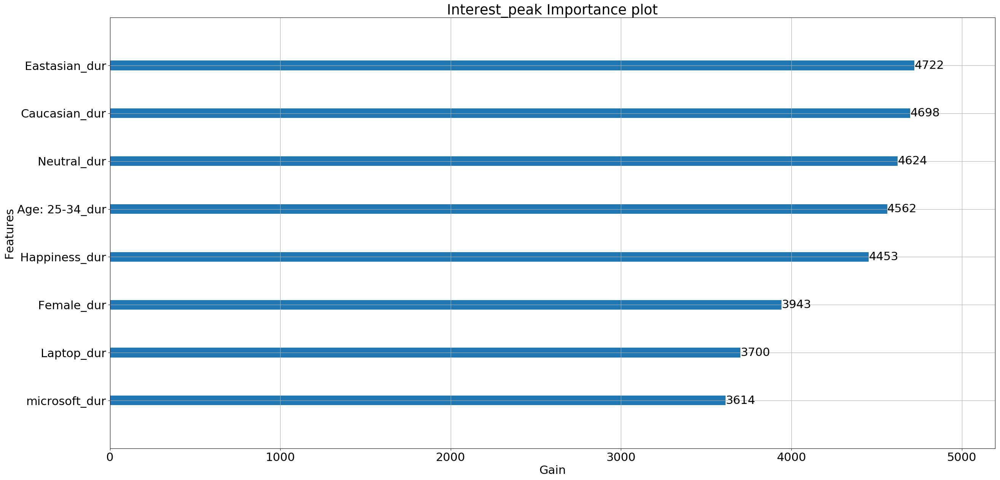

Interest_mean_score
open area
competing
paper
using tools
still water
smoke
symmetrical
length_of_ad_15
rugged scene
moist
bathing
Tablet_last_ocr
hiking
Surface_group_first_ocr
railing
vertical components
scary
aged
shopping
sports
dirty
microsoft_last_ocr
cloth
climbing
fire
far-away horizon
touring
congregating
diving
training
matte
playing
Laptop_last_ocr
Age: 25-34_dur
shrubbery
swimming
African_dur
soothing
socializing
Macbook_group_dur
semi-enclosed area
carpet
wood
Surface_group_dur
horizontal components
foliage
praying
Laptop_total_ocr
studying
Tablet_dur
exercise
Tablet_first_ocr
Laptop_dur
sunny
leaves
gaming
Surface_group_last_ocr
transporting
Neutral_dur
Surface_group_total_ocr
boating
flowers
trees
working
metal
microsoft_first_ocr
stressful
microsoft_total_ocr
Male_dur
reading
clouds
Tablet_total_ocr
Sadness_dur
Female_dur
microsoft_dur
spectating
ice
ocean
driving
Caucasian_dur
vegetation
plastic
glass
grass
Age: 35-44_dur
Happiness_dur
sterile
brick
asphalt
natural
dry

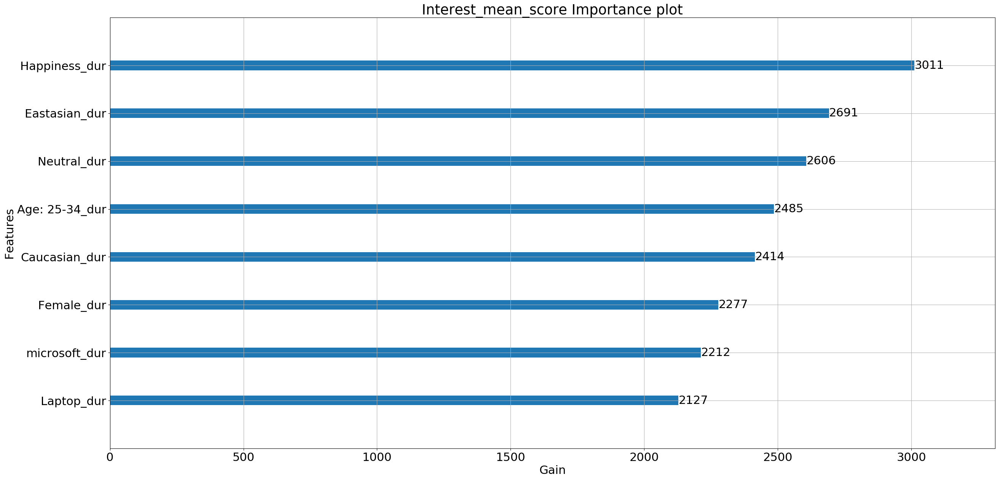

Purchase_intent
shrubbery
semi-enclosed area
smoke
cluttered space
hiking
camping
microsoft_first_ocr
biking
studying
foliage
plastic
leaves
dirt
still water
pavement
congregating
metal
microsoft_total_ocr
vertical components
gaming
moist
transporting
wood
vegetation
Tablet_dur
glossy
ocean
Surface_group_last_ocr
rugged scene
aged
eating
asphalt
trees
Tablet_total_ocr
carpet
warm
sunny
natural
running water
scary
ice
diving
soothing
swimming
fire
brick
dirty
Surface_group_dur
cold
praying
grass
driving
Laptop_total_ocr
bathing
Tablet_last_ocr
glass
boating
microsoft_last_ocr
conducting business
Laptop_last_ocr
clouds
dry
Tablet_first_ocr
socializing
using tools
stressful
length_of_ad_15
shopping
climbing
Surface_group_total_ocr
sports
paper
flowers
microsoft_dur
Laptop_dur
matte
railing
Neutral_dur
exercise
medical activity
far-away horizon
reading
sand
vinyl
Female_dur
Happiness_dur
sterile
symmetrical
Surface_group_first_ocr
training
Caucasian_dur
spectating
African_dur
cloth
Sadness

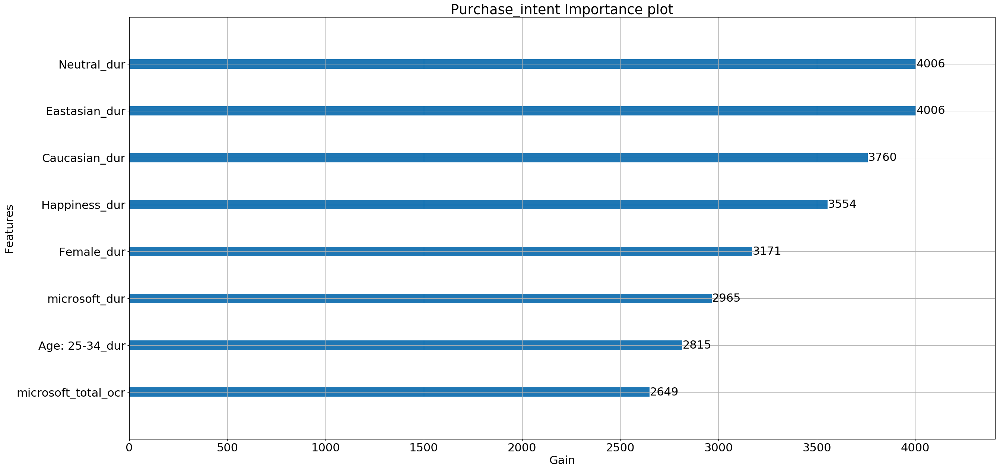

Persuasion_mean
still water
camping
brick
congregating
microsoft_first_ocr
boating
stressful
warm
pavement
Laptop_dur
studying
Surface_group_dur
plastic
biking
moist
Surface_group_total_ocr
metal
Tablet_first_ocr
soothing
climbing
clouds
Laptop_total_ocr
microsoft_total_ocr
Surface_group_last_ocr
dry
microsoft_last_ocr
sterile
gaming
vertical components
trees
aged
Tablet_total_ocr
Laptop_last_ocr
Surface_group_first_ocr
Sadness_dur
natural
length_of_ad_15
rugged scene
Happiness_dur
Tablet_dur
spectating
Female_dur
far-away horizon
Caucasian_dur
Laptop_first_ocr
cold
Tablet_last_ocr
sunny
driving
Age: 25-34_dur
Eastasian_dur
cluttered space
research
Age: 35-44_dur
African_dur
diving
leaves
foliage
scary
sports
vegetation
semi-enclosed area
horizontal components
microsoft_dur
Neutral_dur
using tools
wood
shrubbery
Male_dur
paper
exercise
matte
reading
swimming
asphalt
transporting
shopping
ocean
tiles
symmetrical
grass
dirty
socializing
carpet
playing
touring
flowers
medical activity
run

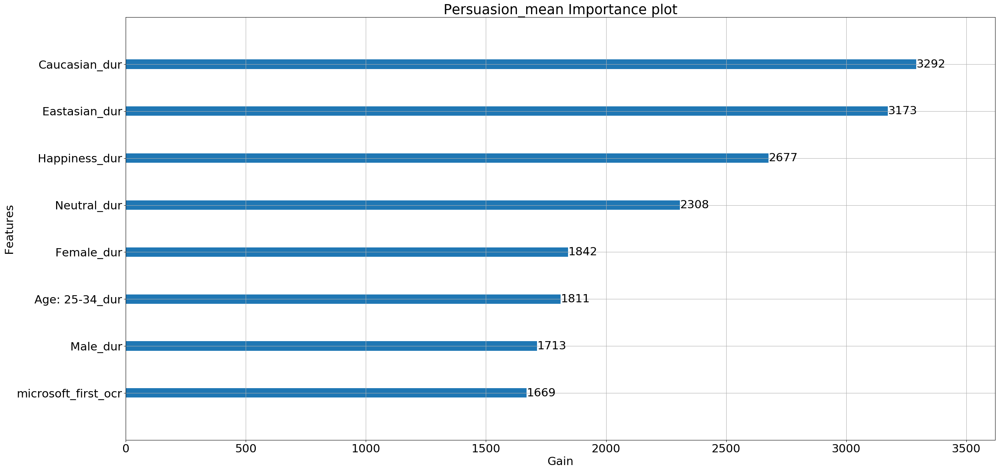

Persuasion_very_likely
camping
brick
still water
boating
microsoft_first_ocr
pavement
stressful
natural
Laptop_dur
Tablet_first_ocr
Surface_group_dur
far-away horizon
warm
metal
moist
Surface_group_total_ocr
congregating
microsoft_total_ocr
studying
plastic
aged
swimming
biking
Laptop_total_ocr
vertical components
clouds
soothing
dry
Surface_group_last_ocr
sunny
wood
Female_dur
length_of_ad_15
gaming
spectating
rugged scene
asphalt
sterile
climbing
vegetation
cold
scary
Tablet_total_ocr
Surface_group_first_ocr
Age: 25-34_dur
diving
Happiness_dur
microsoft_last_ocr
hiking
Sadness_dur
Laptop_first_ocr
sports
Eastasian_dur
Tablet_dur
microsoft_dur
foliage
driving
Tablet_last_ocr
flowers
Laptop_last_ocr
Age: 35-44_dur
African_dur
Neutral_dur
sand
railing
matte
running water
glass
symmetrical
Caucasian_dur
shopping
semi-enclosed area
ice
smoke
leaves
shrubbery
exercise
Male_dur
socializing
trees
snow
transporting
research
training
horizontal components
cluttered space
using tools
reading
to

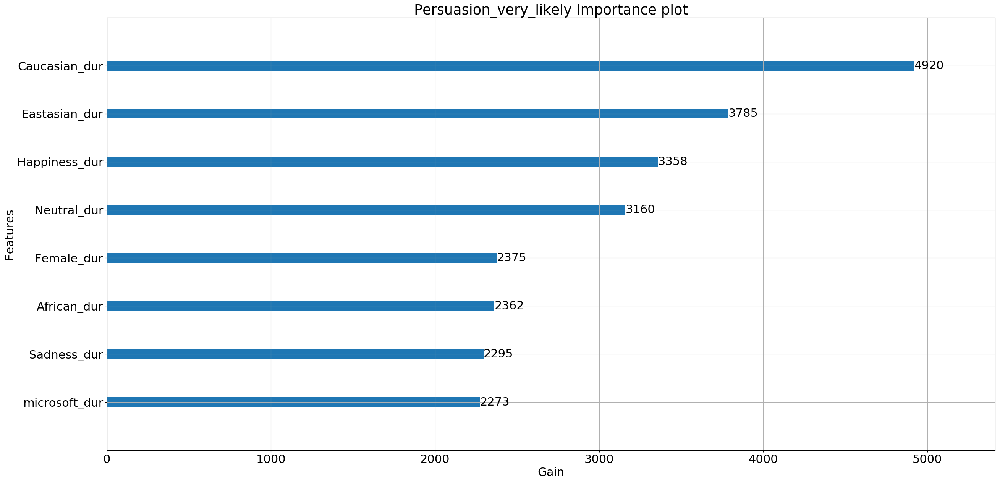

Interest_peak_frames
matte
scary
moist
metal
microsoft_first_ocr
asphalt
studying
cloth
Surface_group_total_ocr
Tablet_total_ocr
diving
plastic
soothing
training
leaves
ocean
Surface_group_first_ocr
touring
swimming
man-made
gaming
far-away horizon
Surface_group_dur
horizontal components
grass
congregating
vertical components
Neutral_dur
stressful
Tablet_first_ocr
Surface_group_last_ocr
cluttered space
microsoft_last_ocr
still water
glass
clouds
Tablet_last_ocr
foliage
Laptop_last_ocr
exercise
brick
snow
using tools
conducting business
hiking
sports
sunny
trees
Laptop_first_ocr
Tablet_dur
Laptop_dur
Laptop_total_ocr
vinyl
wood
symmetrical
driving
playing
ice
Sadness_dur
biking
microsoft_total_ocr
boating
warm
microsoft_dur
competing
running water
flowers
transporting
dry
vegetation
Age: 25-34_dur
carpet
length_of_ad_15
paper
climbing
cold
rugged scene
research
medical activity
aged
shopping
Female_dur
bathing
reading
natural light
Macbook_group_dur
sterile
natural
socializing
spectatin

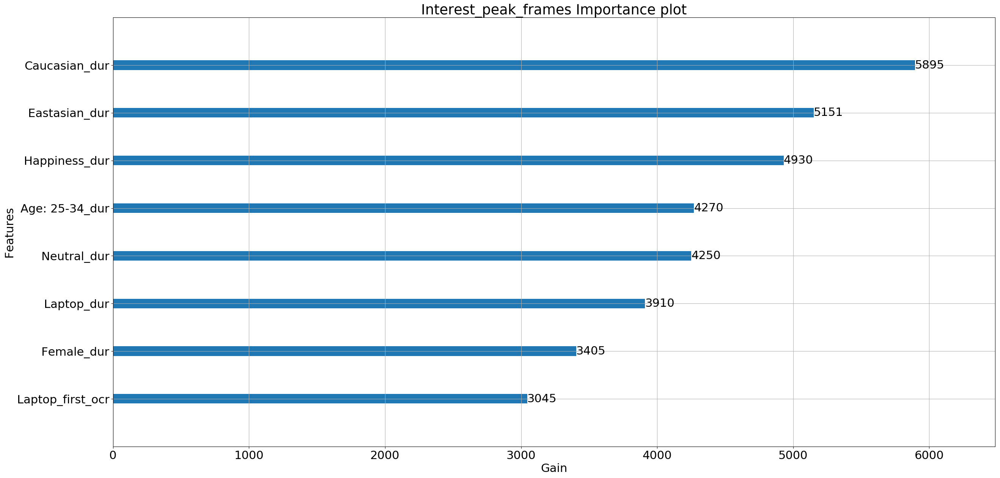

Enjoyment_vey_much
length_of_ad_15
microsoft_total_ocr
asphalt
aged
metal
camping
plastic
microsoft_last_ocr
paper
microsoft_first_ocr
Surface_group_dur
still water
dry
Macbook_group_dur
natural light
boating
sunny
playing
Surface_group_total_ocr
Tablet_first_ocr
gaming
dirt
using tools
working
far-away horizon
Tablet_last_ocr
Surface_group_last_ocr
Laptop_last_ocr
clouds
medical activity
warm
Laptop_total_ocr
moist
Surface_group_first_ocr
trees
training
natural
Tablet_total_ocr
vinyl
swimming
bathing
reading
soothing
Neutral_dur
studying
congregating
running water
socializing
ocean
Caucasian_dur
snow
biking
matte
leaves
carpet
Laptop_first_ocr
climbing
Laptop_dur
stressful
transporting
fire
exercise
spectating
brick
wood
horizontal components
cloth
Happiness_dur
cold
rugged scene
Tablet_dur
diving
research
enclosed area
scary
competing
vertical components
conducting business
African_dur
shrubbery
touring
driving
grass
Age: 25-34_dur
man-made
cluttered space
Age: 35-44_dur
eating
Femal

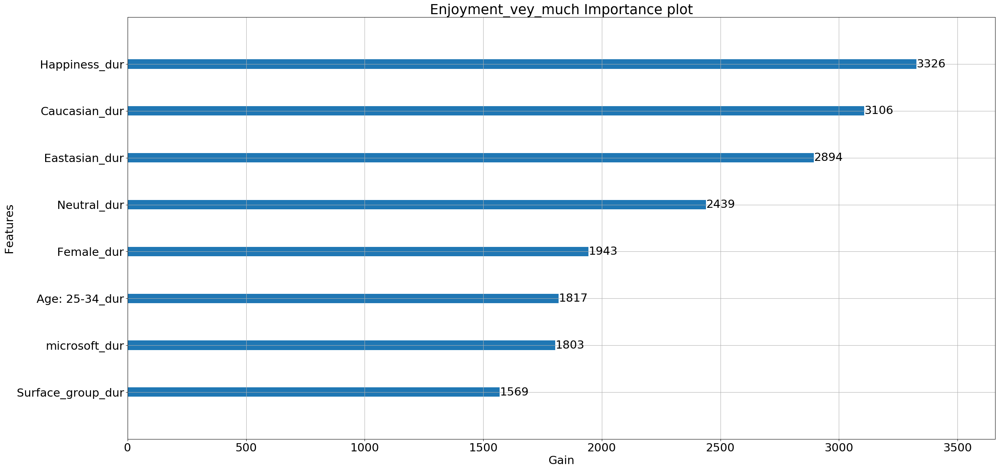

Aided_Branding_almost_anything
open area
man-made
bathing
Surface_group_total_ocr
sand
asphalt
natural light
Surface_group_dur
touring
dirt
microsoft_last_ocr
carpet
swimming
scary
studying
length_of_ad_15
spectating
still water
competing
eating
socializing
plastic
moist
foliage
driving
Surface_group_first_ocr
microsoft_first_ocr
hiking
enclosed area
horizontal components
Neutral_dur
diving
transporting
grass
leaves
glass
sterile
Caucasian_dur
Tablet_total_ocr
smoke
pavement
clouds
sports
running water
Surface_group_last_ocr
cluttered space
cold
Laptop_last_ocr
vegetation
soothing
Tablet_last_ocr
fire
Laptop_total_ocr
aged
shopping
stressful
boating
microsoft_total_ocr
ice
Tablet_first_ocr
vertical components
sunny
snow
Sadness_dur
paper
climbing
ocean
congregating
Female_dur
warm
Tablet_dur
Laptop_first_ocr
reading
training
brick
symmetrical
Macbook_group_dur
dry
metal
praying
Male_dur
vinyl
wood
matte
medical activity
railing
far-away horizon
cloth
Age: 35-44_dur
Laptop_dur
Age: 25-3

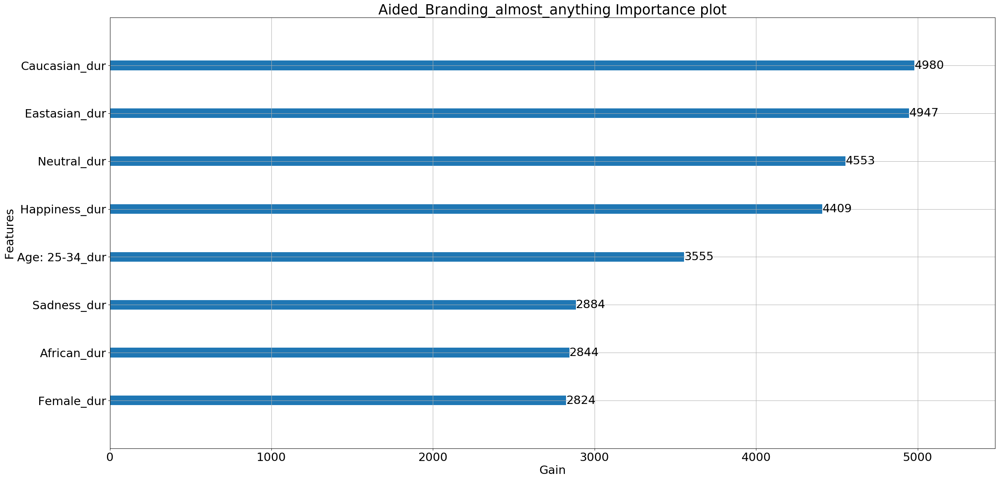

Brand_Cues_very_easily
plastic
microsoft_last_ocr
boating
spectating
playing
Surface_group_dur
smoke
congregating
microsoft_total_ocr
microsoft_first_ocr
dirt
fire
vinyl
sand
snow
metal
natural
Surface_group_last_ocr
still water
bathing
competing
shrubbery
leaves
ice
foliage
driving
Age: 35-44_dur
Tablet_total_ocr
warm
training
dirty
medical activity
grass
Laptop_dur
cluttered space
Laptop_total_ocr
moist
socializing
flowers
African_dur
cold
Macbook_group_dur
tiles
rugged scene
Caucasian_dur
Laptop_last_ocr
horizontal components
Tablet_first_ocr
Male_dur
using tools
dry
Laptop_first_ocr
matte
Surface_group_total_ocr
sunny
hiking
railing
soothing
semi-enclosed area
length_of_ad_15
studying
diving
asphalt
Surface_group_first_ocr
far-away horizon
gaming
sports
carpet
Tablet_last_ocr
transporting
Neutral_dur
vertical components
touring
microsoft_dur
clouds
trees
scary
research
swimming
Tablet_dur
Sadness_dur
aged
conducting business
Age: 25-34_dur
running water
symmetrical
ocean
paper
glos

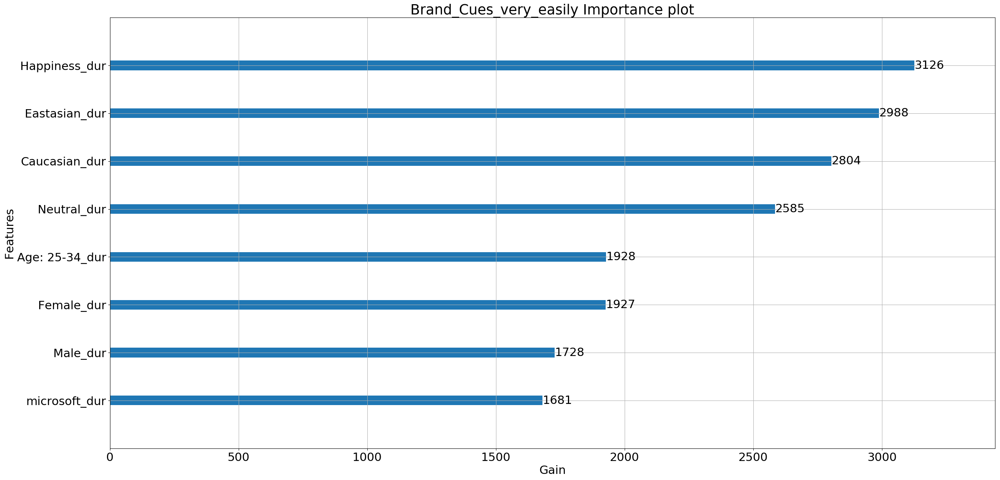

Brand_Appeal_more_appealing
length_of_ad_15
biking
rugged scene
microsoft_last_ocr
bathing
asphalt
trees
African_dur
microsoft_first_ocr
still water
plastic
using tools
Surface_group_total_ocr
aged
dirty
studying
sunny
camping
dry
clouds
metal
Surface_group_dur
microsoft_total_ocr
paper
boating
gaming
symmetrical
Surface_group_last_ocr
dirt
medical activity
Laptop_total_ocr
vinyl
warm
Sadness_dur
soothing
stressful
Surface_group_first_ocr
training
flowers
Laptop_last_ocr
grass
Neutral_dur
Caucasian_dur
leaves
swimming
Tablet_first_ocr
fire
congregating
climbing
ice
reading
Tablet_total_ocr
moist
eating
driving
wood
socializing
diving
tiles
running water
carpet
conducting business
Age: 25-34_dur
touring
Tablet_dur
Laptop_first_ocr
horizontal components
spectating
far-away horizon
foliage
railing
research
pavement
natural light
sports
semi-enclosed area
playing
Female_dur
Laptop_dur
cluttered space
vegetation
snow
shrubbery
open area
Tablet_last_ocr
microsoft_dur
Macbook_group_dur
cold
e

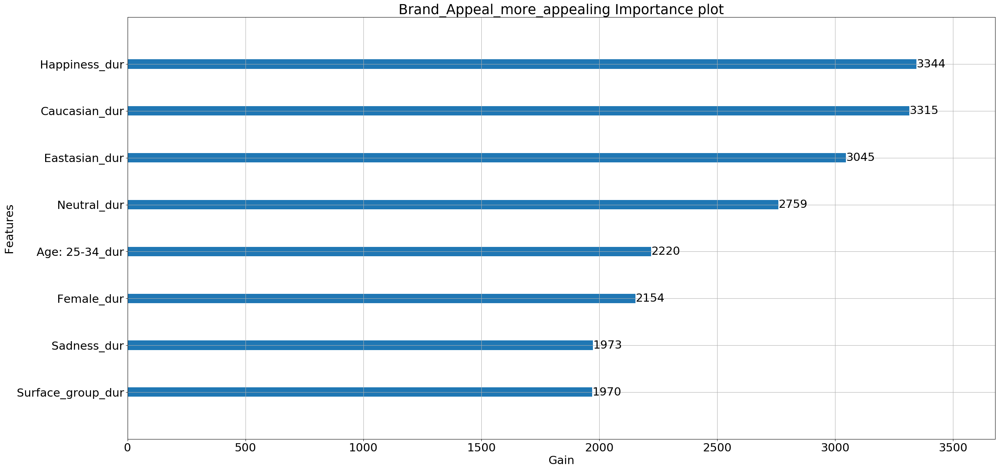

Understanding_very_easily
hiking
ice
boating
sunny
dirt
African_dur
smoke
Macbook_group_dur
vertical components
gaming
natural light
grass
Surface_group_dur
Laptop_first_ocr
driving
shopping
socializing
metal
fire
plastic
swimming
spectating
clouds
natural
Tablet_last_ocr
tiles
wood
Tablet_dur
brick
Age: 35-44_dur
studying
conducting business
playing
carpet
touring
soothing
Tablet_total_ocr
glass
rugged scene
shrubbery
aged
dirty
congregating
transporting
still water
microsoft_last_ocr
scary
exercise
Tablet_first_ocr
diving
Surface_group_last_ocr
Caucasian_dur
stressful
foliage
flowers
training
trees
matte
asphalt
Surface_group_first_ocr
Neutral_dur
horizontal components
microsoft_dur
microsoft_total_ocr
cold
microsoft_first_ocr
sand
vinyl
railing
cluttered space
Surface_group_total_ocr
Laptop_total_ocr
Laptop_last_ocr
Laptop_dur
ocean
research
Sadness_dur
vegetation
Male_dur
snow
leaves
sports
warm
competing
Age: 25-34_dur
eating
biking
bathing
running water
camping
man-made
Eastasian

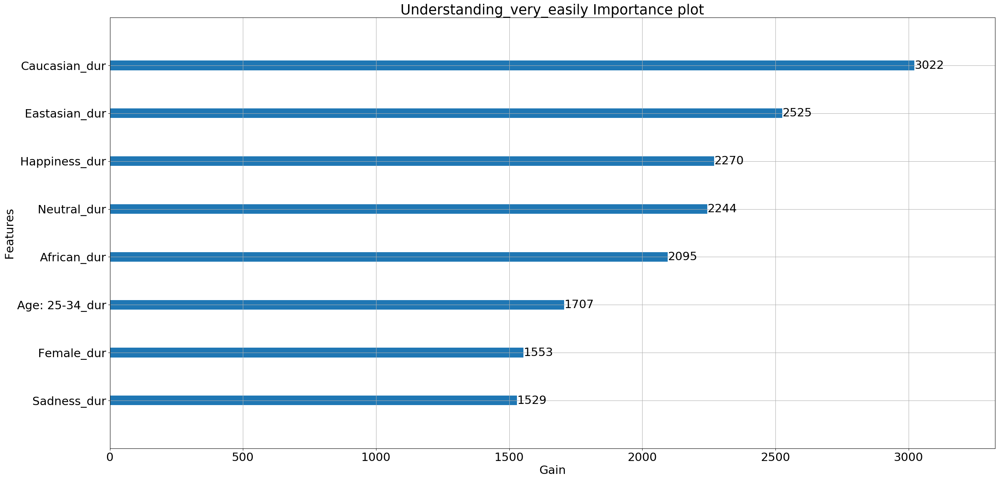

Relevance_Information_very_relevant
metal
wood
plastic
boating
no horizon
congregating
moist
tiles
foliage
smoke
microsoft_total_ocr
aged
working
spectating
Surface_group_last_ocr
glossy
cloth
far-away horizon
man-made
asphalt
sunny
indoor lighting
open area
Laptop_total_ocr
bathing
Tablet_total_ocr
vertical components
dirty
enclosed area
African_dur
socializing
trees
sterile
glass
using tools
Laptop_last_ocr
biking
length_of_ad_15
studying
paper
Male_dur
matte
Surface_group_dur
shopping
brick
climbing
microsoft_last_ocr
Caucasian_dur
Tablet_last_ocr
natural
touring
Age: 25-34_dur
playing
pavement
dry
running water
Tablet_first_ocr
training
grass
rugged scene
exercise
Laptop_dur
cold
clouds
medical activity
microsoft_first_ocr
gaming
Surface_group_total_ocr
ice
flowers
Tablet_dur
Macbook_group_dur
driving
carpet
Surface_group_first_ocr
symmetrical
eating
semi-enclosed area
diving
research
Laptop_first_ocr
conducting business
stressful
leaves
still water
Happiness_dur
Neutral_dur
horizo

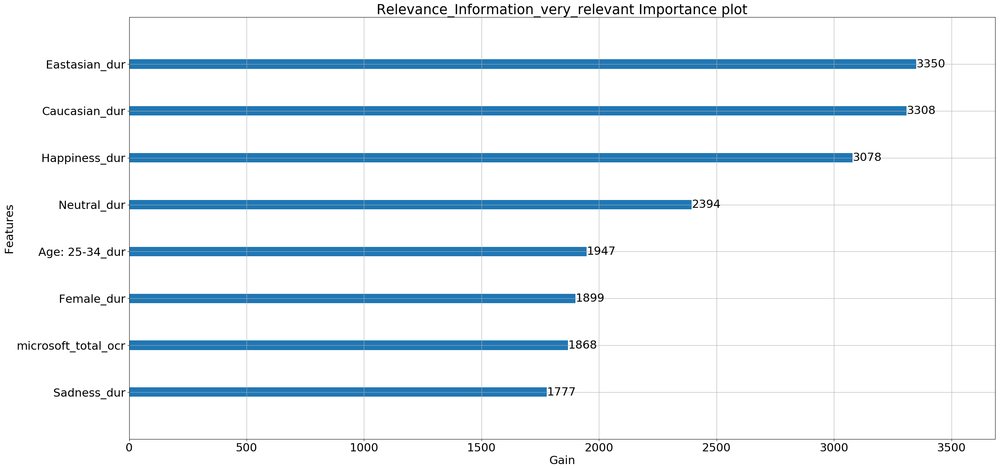

Credibility_Information_agree_strongly
Macbook_group_dur
metal
spectating
dirt
Tablet_total_ocr
indoor lighting
tiles
boating
Surface_group_last_ocr
leaves
length_of_ad_15
wood
Tablet_last_ocr
bathing
socializing
enclosed area
still water
plastic
man-made
ice
moist
medical activity
dry
Tablet_first_ocr
fire
glossy
clouds
microsoft_total_ocr
Tablet_dur
paper
soothing
microsoft_last_ocr
cloth
aged
no horizon
Laptop_total_ocr
open area
working
camping
Laptop_first_ocr
warm
Male_dur
railing
dirty
Surface_group_dur
using tools
vinyl
congregating
Surface_group_first_ocr
Laptop_last_ocr
vertical components
playing
Caucasian_dur
studying
trees
stressful
swimming
vegetation
African_dur
smoke
Sadness_dur
training
diving
cold
sunny
conducting business
driving
microsoft_first_ocr
biking
microsoft_dur
foliage
Neutral_dur
reading
competing
flowers
asphalt
horizontal components
Laptop_dur
rugged scene
snow
Happiness_dur
brick
Surface_group_total_ocr
gaming
far-away horizon
running water
glass
Female_

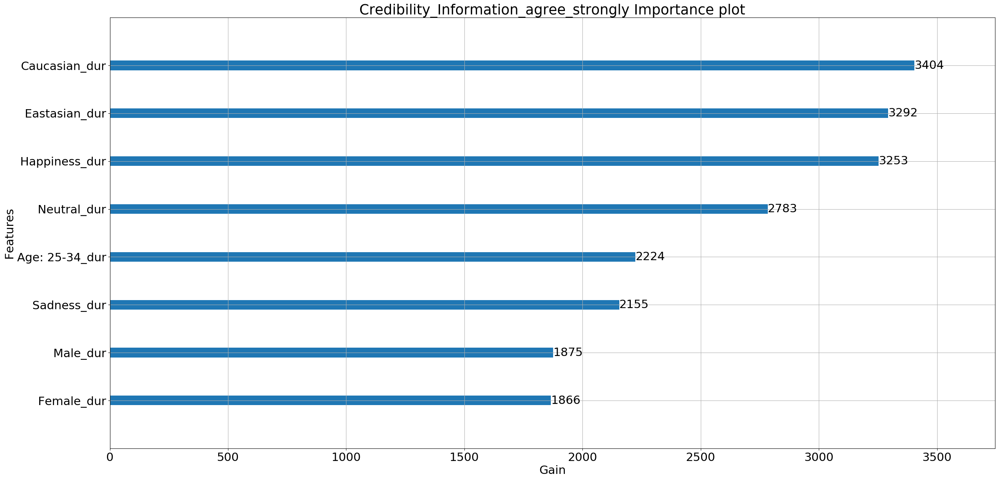

New_Information_alot
Surface_group_total_ocr
tiles
Tablet_last_ocr
Surface_group_first_ocr
plastic
Tablet_first_ocr
brick
rugged scene
far-away horizon
trees
length_of_ad_15
microsoft_last_ocr
still water
using tools
warm
clouds
boating
Surface_group_dur
Tablet_total_ocr
diving
scary
African_dur
dirty
smoke
transporting
flowers
railing
moist
leaves
Surface_group_last_ocr
Laptop_total_ocr
studying
glossy
sunny
Neutral_dur
touring
dirt
microsoft_total_ocr
semi-enclosed area
metal
natural
cloth
working
Macbook_group_dur
microsoft_first_ocr
dry
Tablet_dur
soothing
carpet
sand
bathing
climbing
driving
research
natural light
Laptop_last_ocr
Sadness_dur
grass
hiking
ocean
running water
cluttered space
foliage
stressful
horizontal components
exercise
Caucasian_dur
praying
gaming
spectating
playing
man-made
asphalt
competing
swimming
sports
matte
conducting business
paper
Laptop_first_ocr
Age: 25-34_dur
socializing
reading
vertical components
wood
medical activity
vegetation
shrubbery
Age: 35-4

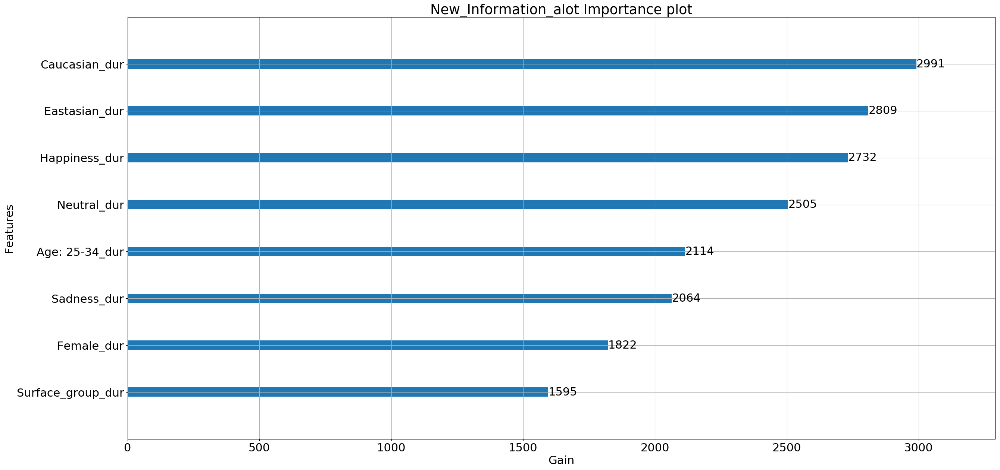

Brand_Difference_strongly
length_of_ad_15
plastic
Tablet_first_ocr
Surface_group_first_ocr
rugged scene
microsoft_last_ocr
moist
trees
still water
conducting business
Surface_group_total_ocr
Surface_group_last_ocr
playing
hiking
dirt
Tablet_total_ocr
smoke
scary
foliage
bathing
brick
flowers
shopping
Laptop_last_ocr
warm
driving
touring
Tablet_last_ocr
Tablet_dur
dirty
gaming
clouds
sports
microsoft_total_ocr
soothing
Macbook_group_dur
congregating
dry
biking
African_dur
ice
Surface_group_dur
Age: 25-34_dur
sunny
studying
climbing
microsoft_first_ocr
grass
transporting
using tools
railing
metal
stressful
boating
running water
vinyl
Laptop_total_ocr
socializing
diving
ocean
Laptop_dur
swimming
Age: 35-44_dur
sand
cluttered space
natural
Happiness_dur
camping
carpet
symmetrical
leaves
Female_dur
medical activity
eating
asphalt
Laptop_first_ocr
exercise
reading
vertical components
Neutral_dur
paper
pavement
horizontal components
research
far-away horizon
shrubbery
semi-enclosed area
natur

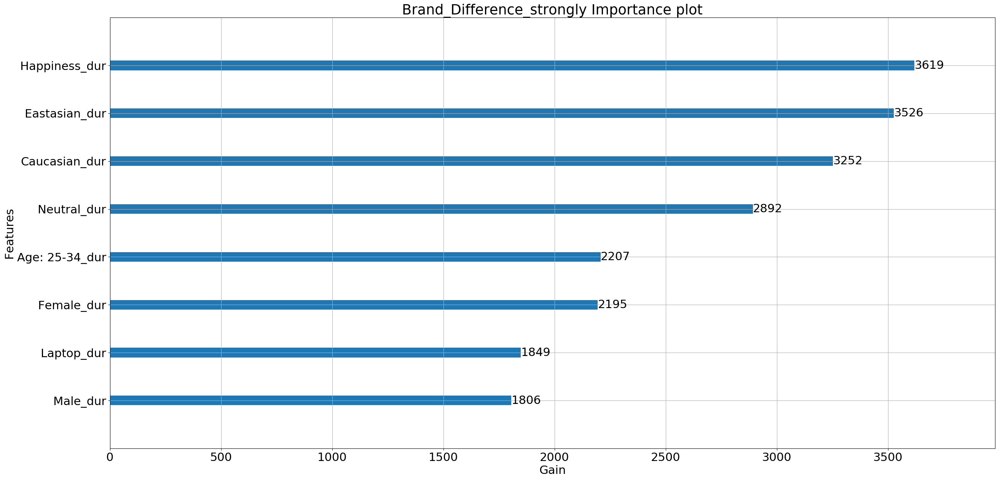

In [36]:
imp_features_xgb = model_xgb.plot_feature_importance(models_xgb_27,10,y_train_27.columns,X_train_27.columns,savefig=False)

In [37]:
for i in range(len(y_test_27.columns)):
    acc_df_xgb.iloc[2:,i]= imp_features_xgb[i,:10]

In [38]:
acc_df_xgb.to_excel('acc_df_xgb.xlsx')

In [45]:
explainer_xgb=[]
shap_values_xgb=[]
for i in tqdm(range(26)):
    explainer_xgb.append(shap.TreeExplainer(models_xgb_27[i]))
    shap_values_xgb.append(explainer_xgb[-1].shap_values(X_train_27))
    print(i)

  4%|▍         | 1/26 [00:34<14:23, 34.54s/it]

0


  8%|▊         | 2/26 [00:45<10:57, 27.39s/it]

1


 12%|█▏        | 3/26 [00:59<09:02, 23.60s/it]

2


 15%|█▌        | 4/26 [01:11<07:17, 19.90s/it]

3


 19%|█▉        | 5/26 [01:20<05:53, 16.82s/it]

4


 23%|██▎       | 6/26 [01:32<05:06, 15.35s/it]

5


 27%|██▋       | 7/26 [01:43<04:22, 13.82s/it]

6


 31%|███       | 8/26 [01:51<03:39, 12.17s/it]

7


 35%|███▍      | 9/26 [02:02<03:18, 11.71s/it]

8


 38%|███▊      | 10/26 [02:12<03:03, 11.44s/it]

9


 42%|████▏     | 11/26 [02:19<02:28,  9.89s/it]

10


 46%|████▌     | 12/26 [02:41<03:09, 13.50s/it]

11


 50%|█████     | 13/26 [02:55<02:58, 13.73s/it]

12


 54%|█████▍    | 14/26 [03:14<03:04, 15.34s/it]

13


 58%|█████▊    | 15/26 [03:28<02:43, 14.89s/it]

14


 62%|██████▏   | 16/26 [03:45<02:34, 15.49s/it]

15


 65%|██████▌   | 17/26 [04:07<02:39, 17.70s/it]

16


 69%|██████▉   | 18/26 [04:22<02:14, 16.77s/it]

17


 73%|███████▎  | 19/26 [04:43<02:06, 18.07s/it]

18


 77%|███████▋  | 20/26 [04:57<01:41, 16.88s/it]

19


 81%|████████  | 21/26 [05:12<01:21, 16.28s/it]

20


 85%|████████▍ | 22/26 [05:26<01:01, 15.42s/it]

21


 88%|████████▊ | 23/26 [05:41<00:46, 15.42s/it]

22


 92%|█████████▏| 24/26 [05:57<00:30, 15.46s/it]

23


 96%|█████████▌| 25/26 [06:11<00:15, 15.25s/it]

24


100%|██████████| 26/26 [06:26<00:00, 15.22s/it]

25


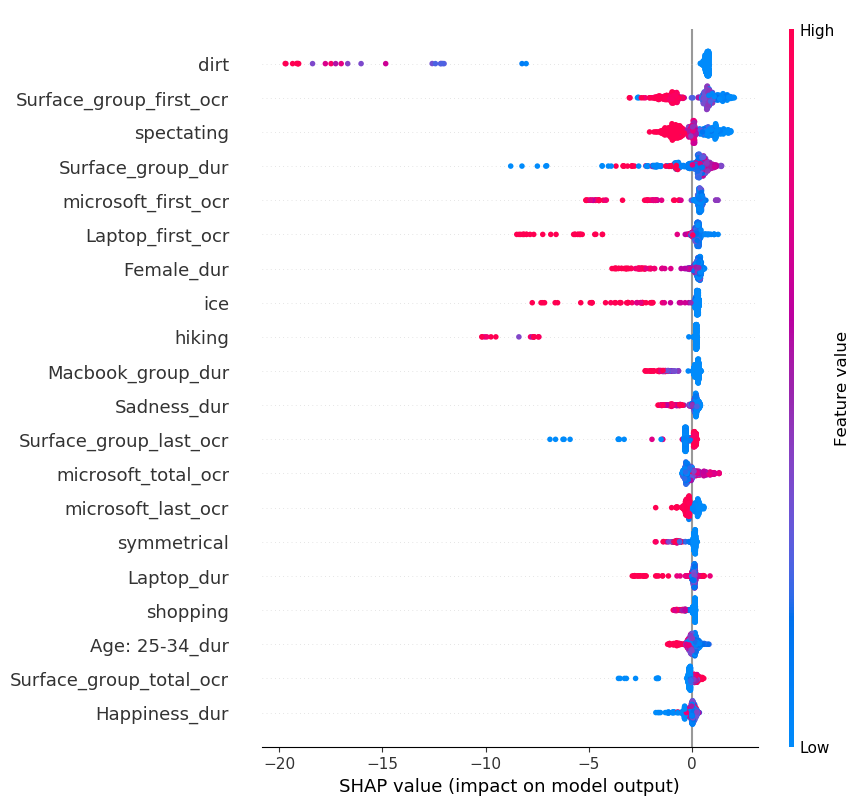

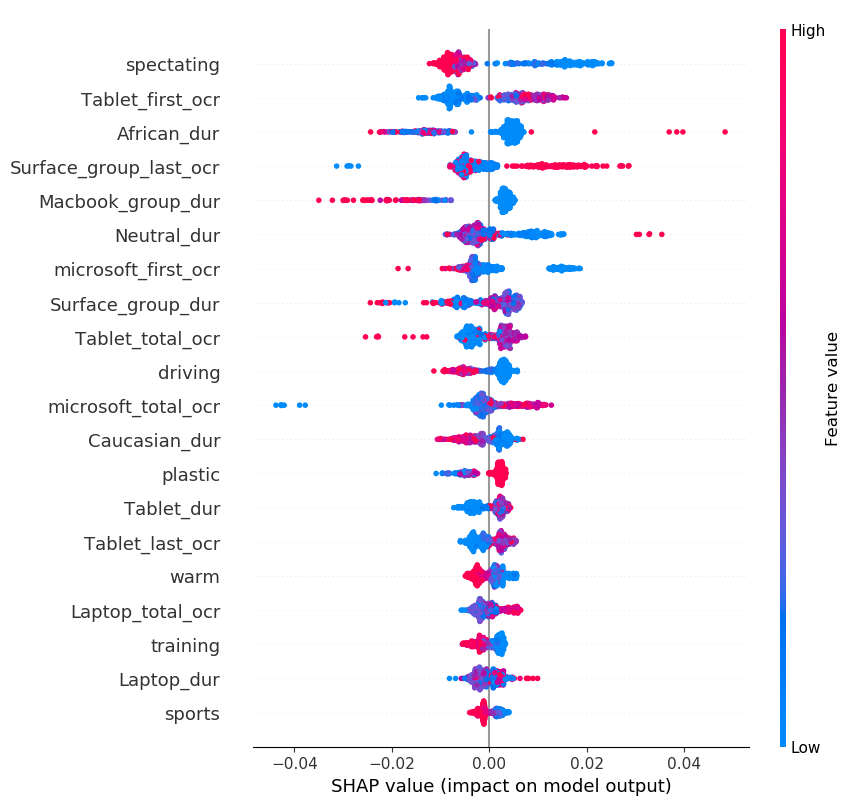

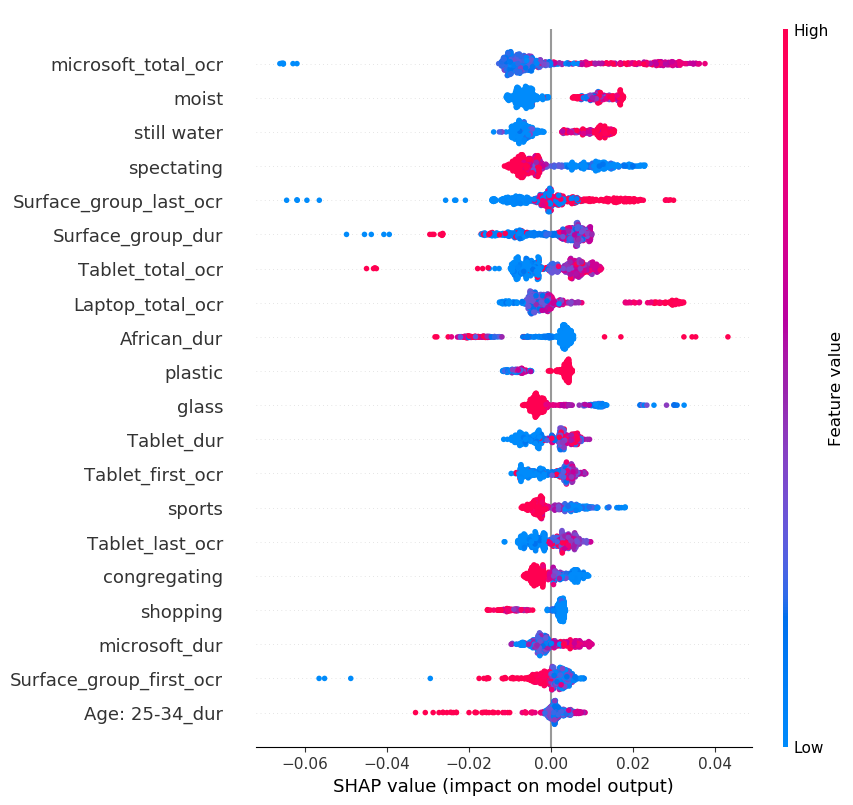

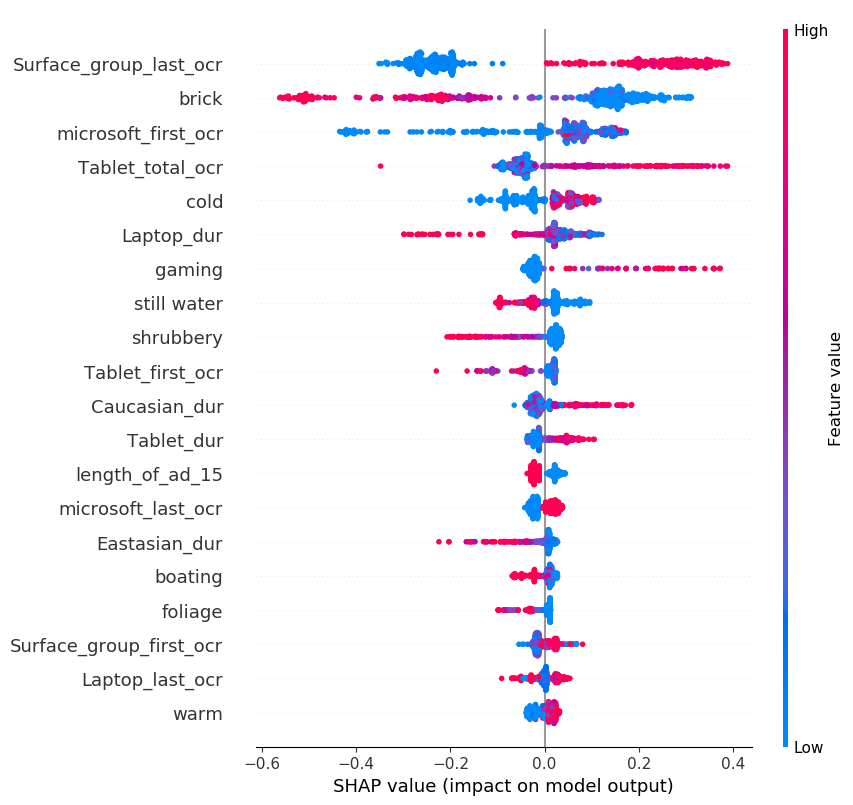

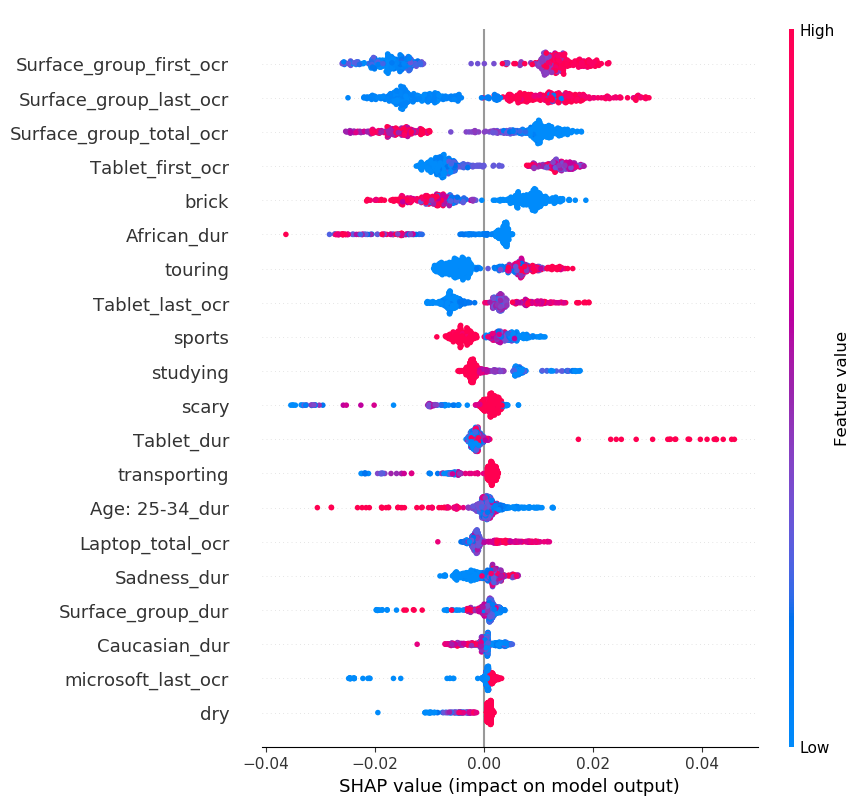

...

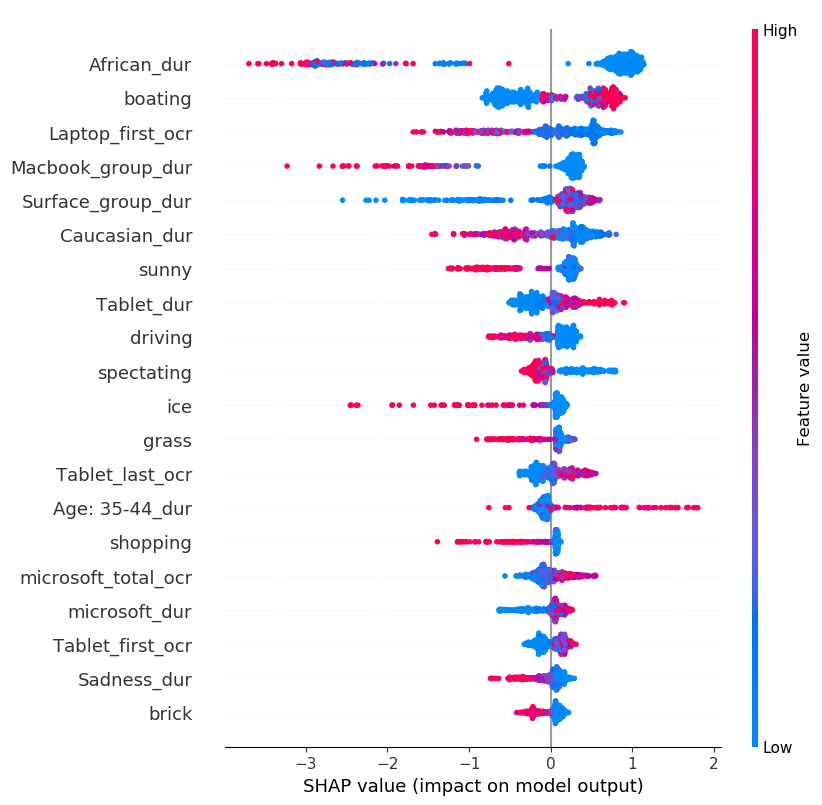

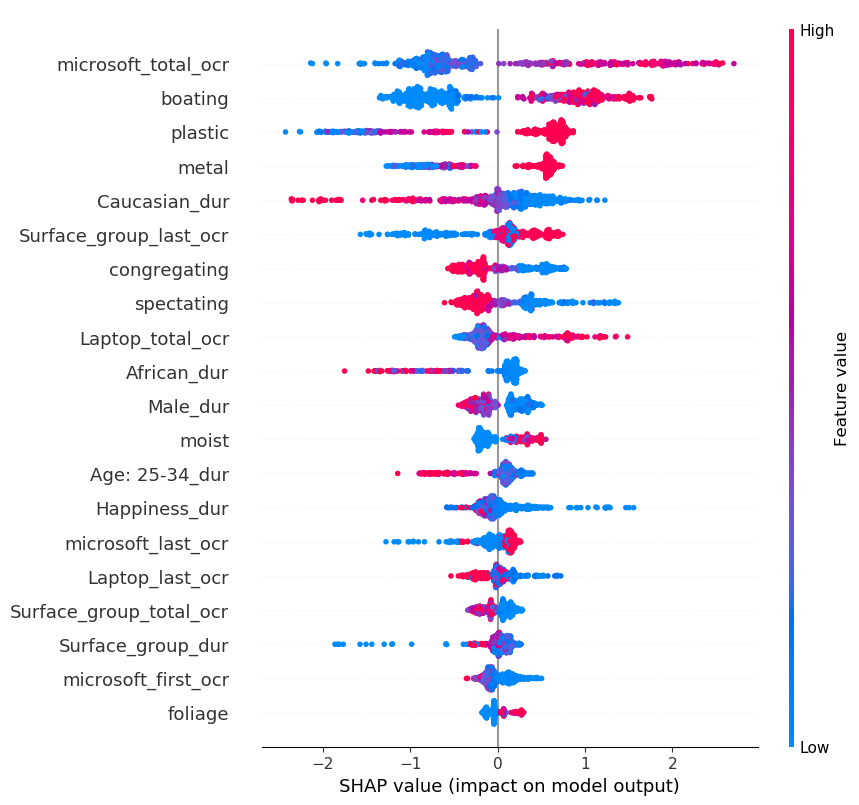

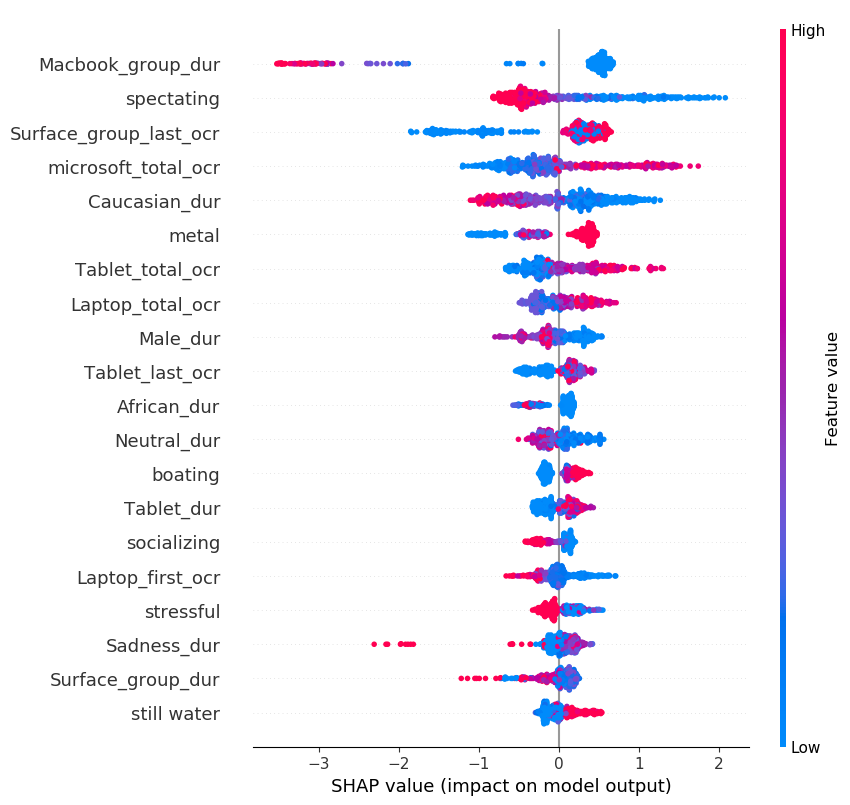

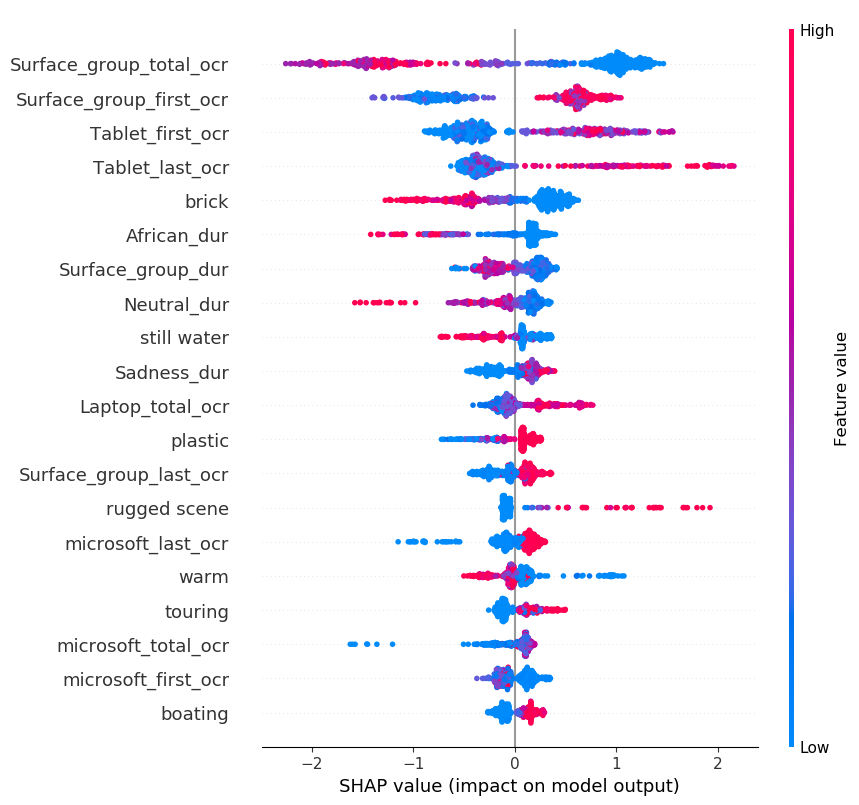

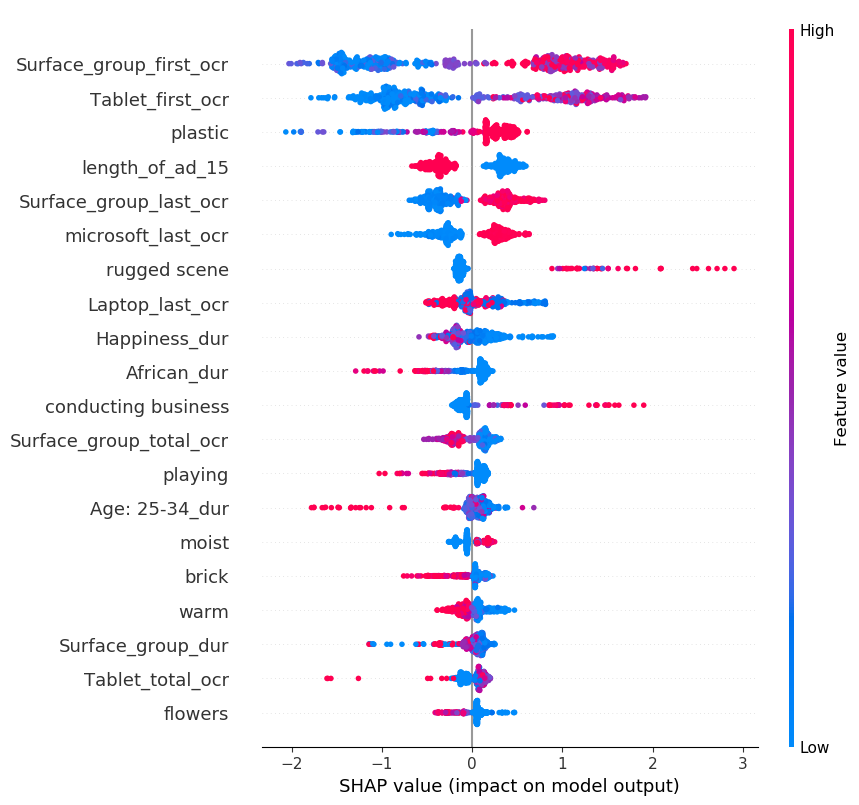

In [46]:
for i in range(26):
    plt.figure()
    shap.summary_plot(shap_values_xgb[i],X_train_27,show=False)
    plt.savefig('./Version_6/Surface/shap_xgb/'+y_train_27.columns[i]+'.png',bbox_inches='tight')

## Shap Analysis

In [47]:
n_features=10

In [83]:
def shap_analysis(shap_values,imp_features):
    shap_analysis_pd = pd.DataFrame(index=[i for i in range(n_features)])
    for k,target in enumerate(y_test_27.columns):
        temp_dict = {}
        feature_impact=pd.DataFrame(columns=[target,target+'_val'],index=[i for i in range(n_features)])
        for i,col in enumerate(imp_features[k,:10]):
            for n,x_col in enumerate(X_train_27.columns):
                if col == x_col:
                    ind= n
            mean =X_train_27.iloc[:,ind].mean()
            std = X_train_27.iloc[:,ind].std()
            indices_high = [n for n in range(len(X_train_27.iloc[:,ind])) if X_train_27.iloc[n,ind] > mean]
            indices_low = [n for n in range(len(X_train_27.iloc[:,ind])) if X_train_27.iloc[n,ind] < mean]
            low_val = shap_values[k][indices_low,ind].mean() if not np.isnan(shap_values[k][indices_low,ind].mean())  else 0 
            high_val = shap_values[k][indices_high,ind].mean() if not np.isnan(shap_values[k][indices_high,ind].mean()) else 0
    #         print(low_val,high_val)
    #         break
            feature_impact.iloc[i,0] = col

            if high_val >= 0 and low_val <=0:
                feature_impact.iloc[i,1] = "postive"
            elif high_val >= 0 and low_val >=0:
                feature_impact.iloc[i,1] = "postive"
            elif high_val <= 0 and low_val >=0:
                feature_impact.iloc[i,1] = "negative"
            elif high_val <= 0 and low_val <=0:
                feature_impact.iloc[i,1] = "negative"
    #         feature_impact.iloc[i,4] = np.argmax(feature_impact.iloc[i,1:4].values)
        shap_analysis_pd = pd.concat((shap_analysis_pd,feature_impact),axis=1)  
    return shap_analysis_pd

In [81]:
shap_analysis_pd.to_excel('shap_analysis_rf.xlsx')

In [55]:
shap_analysis_pd

,Unaided_Branding,Unaided_Branding_val,Brand_Cues__Mean,Brand_Cues__Mean_val,Aided_Branding__Mean,Aided_Branding__Mean_val,Active_Involvement__Mean,Active_Involvement__Mean_val,New_Information__Mean,New_Information__Mean_val,...,Understanding_very_easily,Understanding_very_easily_val,Relevance_Information_very_relevant,Relevance_Information_very_relevant_val,Credibility_Information_agree_strongly,Credibility_Information_agree_strongly_val,New_Information_alot,New_Information_alot_val,Brand_Difference_strongly,Brand_Difference_strongly_val
0,dirt,0.0205762,spectating,-0.00157785,moist,0.000556748,brick,-0.00252137,Surface_group_first_ocr,0.00152416,...,African_dur,-0.0436186,metal,-0.0634027,Macbook_group_dur,0.0381398,Surface_group_total_ocr,0.0941175,Surface_group_first_ocr,-0.0474675
1,Laptop_first_ocr,0.0137985,microsoft_first_ocr,-0.000779035,microsoft_total_ocr,-0.000594093,Surface_group_last_ocr,-0.00507377,Surface_group_total_ocr,0.00144926,...,boating,-0.0273266,plastic,0.0504125,metal,-0.0329621,Surface_group_first_ocr,0.008719,Tablet_first_ocr,-0.0235371
2,microsoft_first_ocr,0.0700265,African_dur,0.000283798,still water,0.000354376,microsoft_first_ocr,0.000611936,scary,-0.000927778,...,grass,0.0626886,boating,0.0140604,Surface_group_last_ocr,-0.0407002,Surface_group_dur,0.0368727,plastic,0.0605865
3,Surface_group_dur,0.0412333,Neutral_dur,-0.000108076,Surface_group_last_ocr,0.000530528,cold,0.00124052,Tablet_first_ocr,-0.000118797,...,sunny,-0.0242155,moist,0.079153,Male_dur,-0.0159806,Tablet_last_ocr,-0.0742761,microsoft_last_ocr,-0.0325003
4,hiking,-0.00549271,Surface_group_dur,0.000463592,spectating,-0.000609654,Laptop_dur,0.0070663,Tablet_total_ocr,-0.00030902,...,Laptop_first_ocr,-0.00178816,microsoft_total_ocr,-0.0347687,spectating,-0.056005,brick,0.011231,length_of_ad_15,-0.0422039
5,Surface_group_first_ocr,0.0937673,Surface_group_last_ocr,0.000289323,Surface_group_dur,0.000127824,clouds,0.00368191,brick,0.000232207,...,Surface_group_dur,0.00195027,congregating,-0.00994038,boating,-0.00727496,Tablet_first_ocr,-0.0362995,Surface_group_last_ocr,-0.0345737
6,ice,-0.000772195,microsoft_total_ocr,0.000314824,Laptop_total_ocr,0.00143435,still water,0.00356578,Tablet_last_ocr,-0.000513207,...,Caucasian_dur,-0.0119215,microsoft_first_ocr,0.0146766,Caucasian_dur,0.0172403,plastic,0.0431484,Surface_group_dur,0.0261887
7,Surface_group_last_ocr,-0.0590573,Tablet_first_ocr,-6.17542e-06,Surface_group_first_ocr,-0.000476172,microsoft_total_ocr,0.000110284,African_dur,-0.000210003,...,ice,0.00778795,Caucasian_dur,0.0452145,Tablet_total_ocr,0.00150317,tiles,-0.0228604,Laptop_last_ocr,-0.00552659
8,Happiness_dur,-0.0521455,sand,0.000100258,glass,0.000152046,Surface_group_first_ocr,0.00209456,Tablet_dur,-0.00024483,...,microsoft_first_ocr,0.00575604,Laptop_total_ocr,0.00618147,Laptop_total_ocr,0.00144708,Neutral_dur,-0.0168286,microsoft_total_ocr,0.0180386
9,spectating,0.000648167,Tablet_total_ocr,0.00013418,plastic,0.00106949,warm,0.00519121,tiles,-0.000429484,...,Neutral_dur,0.00946711,African_dur,-0.0057471,microsoft_total_ocr,-0.0243688,Tablet_total_ocr,-0.00592552,Happiness_dur,0.0072744


In [84]:
shap_analysis_xgb_pd=shap_analysis(shap_values_xgb,imp_features_xgb)

In [86]:
shap_analysis_xgb_pd.to_excel('shap_analysis_xgb.xlsx')

## END

In [60]:
X_train_14.to_excel('../../Version_1.01/x_train_14.xlsx')

In [61]:
X_test_14.to_excel('../../Version_1.01/x_test_14.xlsx')
y_train_14.to_excel('../../Version_1.01/y_train_14.xlsx')
y_test_14.to_excel('../../Version_1.01/y_test_14.xlsx')

In [62]:
X_train_4.to_excel('../../Version_1.01/x_train_4.xlsx')
X_test_4.to_excel('../../Version_1.01/x_test_4.xlsx')
y_train_4.to_excel('../../Version_1.01/y_train_4.xlsx')
y_test_4.to_excel('../../Version_1.01/y_test_4.xlsx')